## Pick and Place - CV: Object detection and classification

In [24]:
# MQTT Test

import paho.mqtt.client as mqtt

BROKER = "10.195.83.10"
PORT = 1883
TOPIC = "esp32/CV"

client = mqtt.Client()

client.connect(BROKER, PORT, 60)

client.publish(TOPIC, "TEST")

client.disconnect()

C:\Users\Range\AppData\Local\Temp\ipykernel_67068\1278505993.py:9: DeprecationWarning: Callback API version 1 is deprecated, update to latest version
  client = mqtt.Client()


<MQTTErrorCode.MQTT_ERR_SUCCESS: 0>

In [12]:
# Check the current working directory

import os
print(os.getcwd())  # te muestra el directorio de trabajo actual

c:\Users\Range\OneDrive\Escritorio\documentos a entregar\6to semestre\CV\PnP_App


In [37]:
# Photo capture
%run tomar_foto.py


Cámara abierta (índice 1)  —  1280×720
Presiona [ESPACIO] para capturar o [ESC] para cancelar.

  ✓ Foto guardada en: c:\Users\Range\OneDrive\Escritorio\documentos a entregar\6to semestre\CV\PnP_App\photo.jpg

  Imagen lista para el pipeline: c:\Users\Range\OneDrive\Escritorio\documentos a entregar\6to semestre\CV\PnP_App\photo.jpg
  Ahora corre deteccion_figuras.py


  PASO 1: Carga de imagen
Imagen cargada. Tamaño (alto, ancho, canales): (720, 1280, 3)

  PASO 2: Detección de bordes (Laplacian)


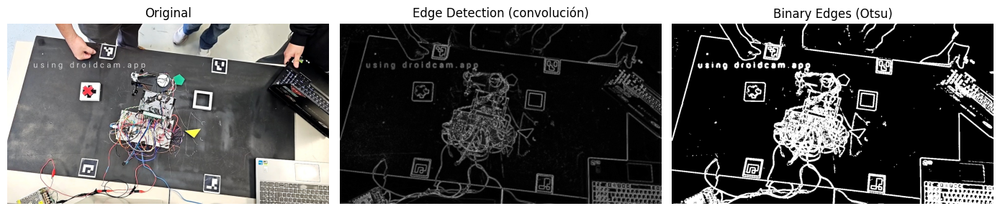


  PASO 3: Harris Corner Detection


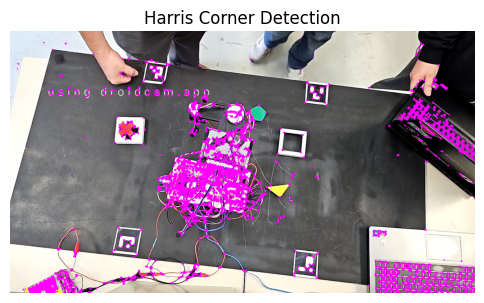


  PASO 4: Máscaras HSV por color


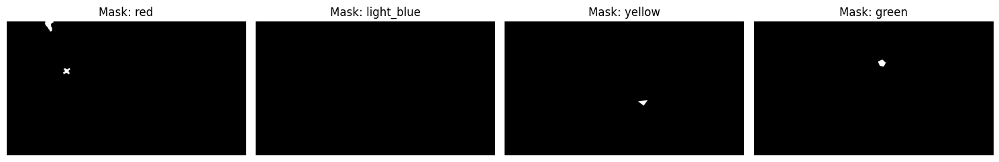


  PASO 5: Detección y clasificación de figuras


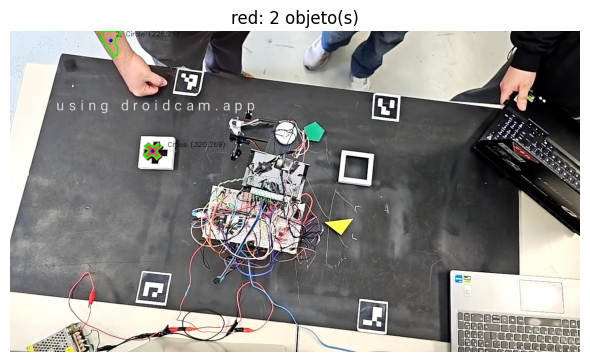

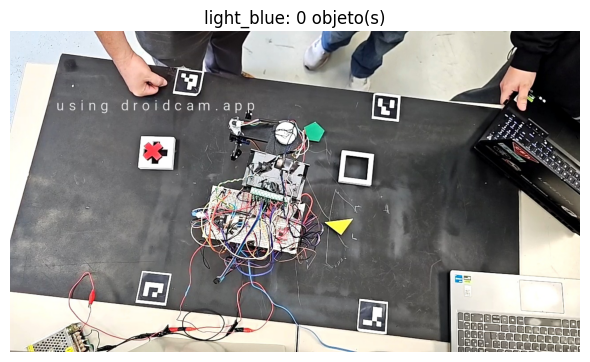

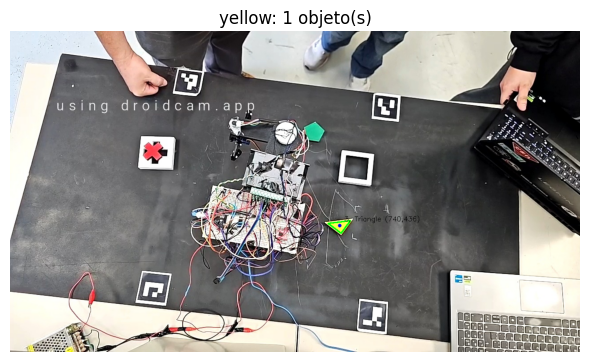

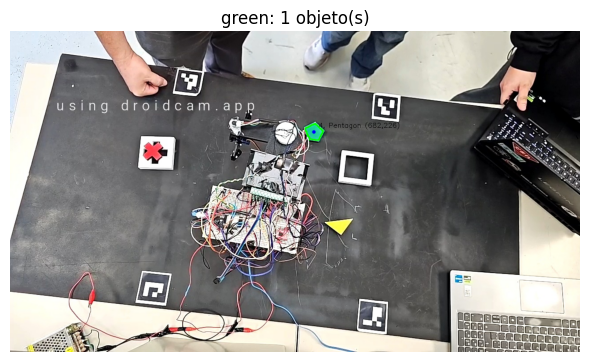

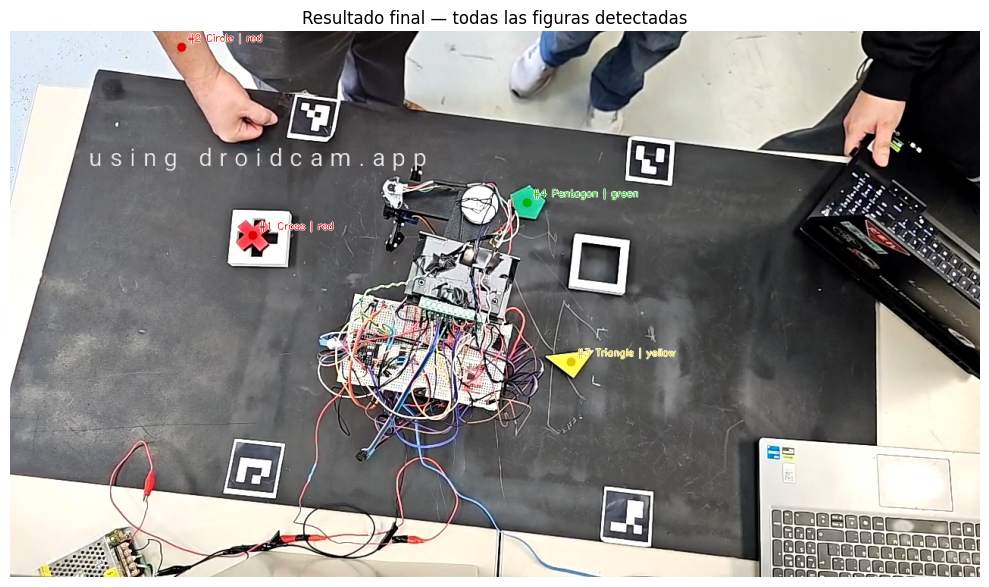


  PASO 6: Cálculo de ángulos de agarre
  Encoder no disponible — se usa mínimo valor absoluto

  ID        Color        Shape     Raw°    Grip°  Método
──────────────────────────────────────────────────────────────────────
   1          red        Cross     47.5    -42.5  cross_+45_sym90
   2          red       Circle      0.0      0.0  circle_symmetric
   3       yellow     Triangle     83.2     83.2  triangle_hypotenuse_perp
   4        green     Pentagon    -11.9    -11.9  pentagon_top_vertex


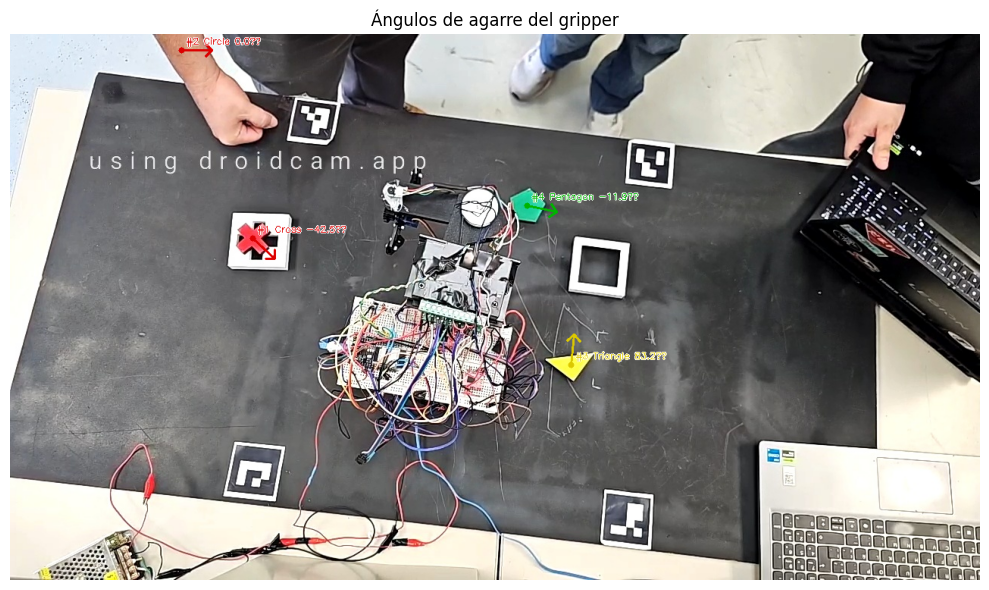


  PASO 7: Homografía ArUco (workspace 530×530 mm)


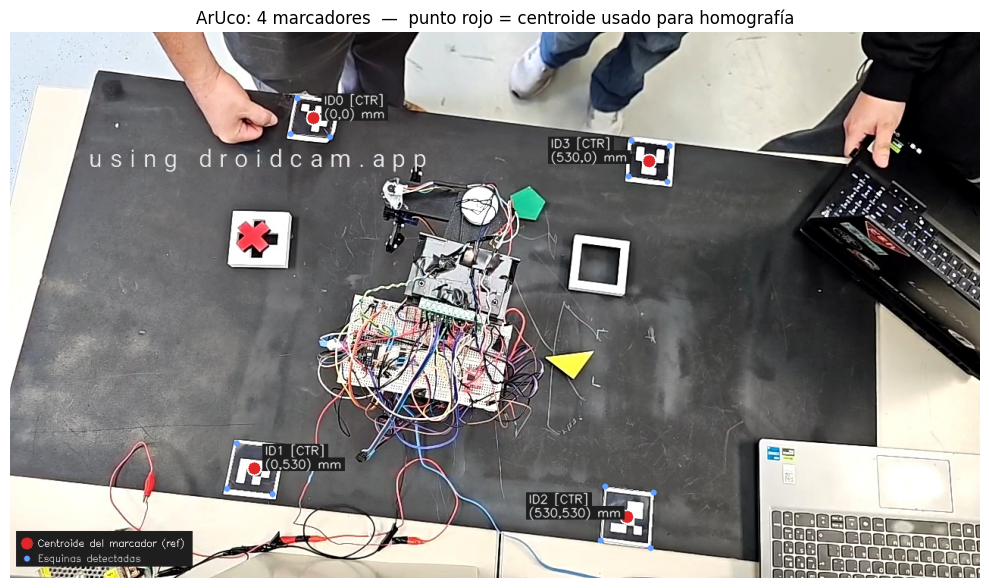

  [ArUco] Homografía calculada correctamente
  Verificación (calculado vs esperado):
    ID1: calc (-0.0,530.0) | esperado (0.0,530.0) | err 0.00 mm
    ID2: calc (530.0,530.0) | esperado (530.0,530.0) | err 0.00 mm
    ID0: calc (-0.0,0.0) | esperado (0.0,0.0) | err 0.00 mm
    ID3: calc (530.0,-0.0) | esperado (530.0,0.0) | err 0.00 mm

Matriz de Homografía H:
[[ 1.192000e+00  2.019000e-01 -5.002457e+02]
 [-1.626000e-01  1.268500e+00 -7.854160e+01]
 [-0.000000e+00  2.000000e-04  1.000000e+00]]

ID    Color        Shape        Pixel (x,y)        Robot (mm)           Dentro?
──────────────────────────────────────────────────────────────────────────────
1     red          Cross        (320,269)         (-61.1,199.5) mm       ✗ FUERA
2     red          Circle       (226,21)         (-226.9,-88.8) mm       ✗ FUERA
3     yellow       Triangle     (740,436)         (433.2,326.6) mm       ✓
4     green        Pentagon     (682,226)         (346.1,93.9) mm       ✓

Dentro del workspace: 2  | 

In [38]:
"""
deteccion_figuras.py
────────────────────
Pipeline completo de visión para VS Code / Python local.
Lee photo.jpg (generada por tomar_foto.py) y ejecuta:

  1. Carga de imagen
  2. Detección de bordes (Laplacian 3×3)       ← SIN CAMBIOS
  3. Harris Corner Detection                    ← SIN CAMBIOS
  4. Máscaras HSV por color                     ← SIN CAMBIOS
  5. Clasificación de forma (multi-epsilon)     ← SIN CAMBIOS
  6. Cálculo de ángulo de orientación para gripper  ← NUEVO
  7. Homografía ArUco pixel → mm (60×60 mm)
  8. Publicación MQTT con ángulo (broker local)
  9. Guardado CSV de respaldo

Orientación ArUco (foto de referencia):
   ID 0 → (0,  0 )   esquina superior-izquierda   Y baja ↓
   ID 1 → (60, 0 )   superior-derecha             X va →
   ID 2 → (60, 60)   inferior-derecha
   ID 3 → (0,  60)   inferior-izquierda

Lógica de ángulo por figura:
   Square    → eje del lado más largo → mod 90° → rango -45° a 45°
   Rectangle → igual que Square
   Triangle  → hipotenusa (lado más largo) → ángulo perpendicular a ella
   Pentagon  → vértice más alto (mínimo Y imagen) → hacia arriba
   Cross     → eje principal de la envolvente + 45°
   Circle    → 0° (simétrico)

Prioridad de color para envío MQTT: red → yellow → light_blue → green

Dependencias:
   pip install opencv-contrib-python numpy matplotlib paho-mqtt
"""

import cv2
import csv
import json
import os
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime

# ── MQTT opcional ─────────────────────────────────────────────────────────
try:
    import paho.mqtt.client as mqtt
    MQTT_AVAILABLE = True
except ImportError:
    MQTT_AVAILABLE = False
    print("[MQTT] paho-mqtt no instalado. Instala con: pip install paho-mqtt")

# ════════════════════════════════════════════════════════════════════════════
#  CONFIGURACIÓN  ← edita aquí según tu entorno
# ════════════════════════════════════════════════════════════════════════════

IMAGE_PATH  = "photo.jpg"
CSV_FOLDER  = "detections"

MQTT_BROKER = "10.195.83.10"
MQTT_PORT   = 1883
MQTT_TOPIC  = "esp32/CV"

# Workspace real del robot (mm)
WS_X_MM = 530.0    # 53.0 cm medidos físicamente entre esquinas interiores
WS_Y_MM = 530.0

# ── Layout real del tablero (visto desde arriba) ──────────────────────────
#
#   ID0 ──────────────── ID3
#    |                    |
#    |   WORKSPACE        |       X →
#    |   54×54 cm         |       Y ↓
#    |                    |
#   ID1 ──────────────── ID2
#
#  Coordenadas robot asignadas:
#   ID0 → (  0,   0)  superior-izquierda
#   ID3 → (540,   0)  superior-derecha
#   ID1 → (  0, 540)  inferior-izquierda
#   ID2 → (540, 540)  inferior-derecha
# ─────────────────────────────────────────────────────────────────────────
ARUCO_ROBOT_COORDS = {
    0: [0.0,     0.0    ],   # sup-izq
    3: [WS_X_MM, 0.0    ],   # sup-der
    1: [0.0,     WS_Y_MM],   # inf-izq
    2: [WS_X_MM, WS_Y_MM],   # inf-der
}

# Esquinas interiores — ya no se usan (se usa centroide como el código de referencia)

# Rango límite del encoder de muñeca (grados)
WRIST_MIN = -135.0
WRIST_MAX =  135.0

# Orden de prioridad de color para el envío MQTT
COLOR_PRIORITY = ["red", "yellow", "light_blue", "green"]

# ════════════════════════════════════════════════════════════════════════════
#  1. CARGAR IMAGEN
# ════════════════════════════════════════════════════════════════════════════

def load_image(path=IMAGE_PATH):
    image = cv2.imread(path)
    if image is None:
        raise FileNotFoundError(
            f"No se encontró la imagen: '{path}'\n"
            "  → Corre primero tomar_foto.py para generar photo.jpg"
        )
    print(f"Imagen cargada. Tamaño (alto, ancho, canales): {image.shape}")
    return image

# ════════════════════════════════════════════════════════════════════════════
#  2. DETECCIÓN DE BORDES — Laplacian 3×3  [SIN CAMBIOS]
# ════════════════════════════════════════════════════════════════════════════

def compute_edges(image):
    gray    = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    edge_kernel = np.array([
        [-1, -1, -1],
        [-1,  8, -1],
        [-1, -1, -1]
    ], dtype=np.float32)

    edges_raw  = cv2.filter2D(blurred, cv2.CV_32F, edge_kernel)
    edges_abs  = np.abs(edges_raw)
    edges_norm = np.clip(edges_abs, 0, 255).astype(np.uint8)

    _, edge_binary = cv2.threshold(
        edges_norm, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU
    )
    edge_binary = cv2.dilate(
        edge_binary,
        cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2)),
        iterations=1
    )

    plt.figure(figsize=(14, 4))
    plt.subplot(1, 3, 1); plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Original"); plt.axis("off")
    plt.subplot(1, 3, 2); plt.imshow(edges_norm, cmap="gray")
    plt.title("Edge Detection (convolución)"); plt.axis("off")
    plt.subplot(1, 3, 3); plt.imshow(edge_binary, cmap="gray")
    plt.title("Binary Edges (Otsu)"); plt.axis("off")
    plt.tight_layout(); plt.show()

    return gray, edge_binary

# ════════════════════════════════════════════════════════════════════════════
#  3. HARRIS CORNERS  [SIN CAMBIOS]
# ════════════════════════════════════════════════════════════════════════════

def harris_corners(image, gray):
    harris_img = image.copy()
    gray_f     = np.float32(gray)
    dst        = cv2.cornerHarris(gray_f, blockSize=3, ksize=3, k=0.04)
    dst        = cv2.dilate(dst, None)
    harris_img[dst > 0.01 * dst.max()] = [255, 0, 255]

    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(harris_img, cv2.COLOR_BGR2RGB))
    plt.title("Harris Corner Detection"); plt.axis("off"); plt.show()

# ════════════════════════════════════════════════════════════════════════════
#  4. MÁSCARAS HSV  [SIN CAMBIOS]
# ════════════════════════════════════════════════════════════════════════════

def build_color_masks(image, edge_binary):
    IMG_H, IMG_W       = image.shape[:2]
    MAX_OBJ_W          = int(IMG_W * 0.40)
    MAX_OBJ_H          = int(IMG_H * 0.40)
    MIN_COMPONENT_AREA = 500

    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    color_ranges = {
        'red': [
            (np.array([0,   100, 80]),  np.array([10,  255, 255])),
            (np.array([165, 100, 80]),  np.array([180, 255, 255])),
        ],
        'light_blue': [
            (np.array([85,  40, 80]),   np.array([105, 200, 255])),
        ],
        'yellow': [
            (np.array([18,  80, 80]),   np.array([35,  255, 255])),
        ],
        'green': [
            (np.array([36,  60, 40]),   np.array([84,  255, 255])),
        ],
    }

    kernel_small = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,  5))
    kernel_large = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11, 11))

    def separate_touching_objects(mask):
        n_before, _, stats_before, _ = cv2.connectedComponentsWithStats(mask)
        n_objects_before = n_before - 1
        if n_objects_before <= 1:
            return mask
        areas = sorted(
            [stats_before[i, cv2.CC_STAT_AREA] for i in range(1, n_before)],
            reverse=True
        )
        ratio = areas[0] / (areas[1] + 1e-5) if len(areas) >= 2 else 1.0
        if ratio < 1.6:
            return mask
        dist = cv2.distanceTransform(mask, cv2.DIST_L2, 5)
        if dist.max() == 0:
            return mask
        _, sure_fg = cv2.threshold(dist, 0.5 * dist.max(), 255, 0)
        sure_fg    = sure_fg.astype(np.uint8)
        if cv2.countNonZero(sure_fg) == 0:
            return mask
        sure_bg = cv2.dilate(mask, kernel_small, iterations=3)
        unknown = cv2.subtract(sure_bg, sure_fg)
        _, markers = cv2.connectedComponents(sure_fg)
        markers    = markers + 1
        markers[unknown == 255] = 0
        img_ws_bgr = cv2.bitwise_and(image, image, mask=mask)
        cv2.watershed(img_ws_bgr, markers)
        result = np.zeros_like(mask)
        for label in np.unique(markers):
            if label <= 1:
                continue
            result[markers == label] = 255
        n_after, _, _, _ = cv2.connectedComponentsWithStats(result)
        if (n_after - 1) < n_objects_before:
            return mask
        return result

    clean_masks = {}
    for color, ranges in color_ranges.items():
        mask = np.zeros(hsv.shape[:2], dtype=np.uint8)
        for lower, upper in ranges:
            mask = cv2.bitwise_or(mask, cv2.inRange(hsv, lower, upper))
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN,  kernel_small, iterations=1)
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel_large, iterations=3)
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN,  kernel_small, iterations=1)
        mask = cv2.bitwise_and(mask, cv2.bitwise_not(edge_binary))
        mask = separate_touching_objects(mask)
        num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(mask)
        filtered_mask = np.zeros_like(mask)
        for i in range(1, num_labels):
            area_i = stats[i, cv2.CC_STAT_AREA]
            w_i    = stats[i, cv2.CC_STAT_WIDTH]
            h_i    = stats[i, cv2.CC_STAT_HEIGHT]
            if area_i >= MIN_COMPONENT_AREA and w_i <= MAX_OBJ_W and h_i <= MAX_OBJ_H:
                filtered_mask[labels == i] = 255
        clean_masks[color] = filtered_mask

    plt.figure(figsize=(15, 6))
    for i, (color, mask) in enumerate(clean_masks.items(), start=1):
        plt.subplot(1, len(clean_masks), i)
        plt.imshow(mask, cmap="gray")
        plt.title(f"Mask: {color}"); plt.axis("off")
    plt.tight_layout(); plt.show()

    return clean_masks

# ════════════════════════════════════════════════════════════════════════════
#  5. CLASIFICACIÓN DE FORMA  [SIN CAMBIOS]
# ════════════════════════════════════════════════════════════════════════════

SOLIDITY_RANGES = {
    "Cross":    (0.40, 0.72),
    "Triangle": (0.82, 0.97),
    "Square":   (0.90, 1.00),
    "Pentagon": (0.88, 0.98),
    "Circle":   (0.92, 1.00),
}

def classify_shape(cnt):
    peri = cv2.arcLength(cnt, True)
    if peri == 0:
        return "Unknown", cnt, 0.0
    area           = cv2.contourArea(cnt)
    hull           = cv2.convexHull(cnt)
    hull_area      = cv2.contourArea(hull)
    solidity       = area / hull_area if hull_area > 0 else 0
    convex_deficit = (hull_area - area) / hull_area if hull_area > 0 else 0
    circ           = (4 * np.pi * area / (peri ** 2)) if peri > 0 else 0

    if solidity < 0.72 and convex_deficit > 0.18:
        approx = cv2.approxPolyDP(cnt, 0.01 * peri, True)
        return "Cross", approx, solidity

    votes = {}
    for eps in [0.02, 0.035, 0.05]:
        approx = cv2.approxPolyDP(cnt, eps * peri, True)
        n      = len(approx)
        if circ > 0.82 and solidity > 0.90:
            candidate = "Circle"
        elif n == 3 and solidity >= 0.82:
            candidate = "Triangle"
        elif n == 4 and solidity >= 0.88:
            candidate = "Square"
        elif n == 5 and solidity >= 0.85:
            candidate = "Pentagon"
        elif 6 <= n <= 9 and solidity >= 0.82:
            candidate = "Pentagon"
        elif n == 3 and solidity >= 0.75:
            candidate = "Triangle"
        else:
            candidate = f"Unknown({n}v,sol={solidity:.2f})"
        votes[candidate] = votes.get(candidate, 0) + 1

    winner       = max(votes, key=lambda k: (votes[k], -list(votes).index(k)))
    eps_map      = {"Triangle": 0.04, "Square": 0.03, "Pentagon": 0.03, "Circle": 0.03}
    eps_final    = eps_map.get(winner, 0.03)
    approx_final = cv2.approxPolyDP(cnt, eps_final * peri, True)
    return winner, approx_final, solidity


def detect_objects(image, clean_masks):
    MIN_AREA  = 500
    objects   = []
    COLOR_BGR = {
        'red':        (0,   0,   220),
        'blue':       (200, 60,  0  ),
        'light_blue': (200, 180, 0  ),
        'yellow':     (0,   200, 220),
        'green':      (0,   180, 0  ),
    }

    for color, mask in clean_masks.items():
        img_result = image.copy()
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        count_this_color = 0

        for cnt in contours:
            area = cv2.contourArea(cnt)
            if area < MIN_AREA:
                continue
            M = cv2.moments(cnt)
            if M["m00"] == 0:
                continue
            cx = int(M["m10"] / M["m00"])
            cy = int(M["m01"] / M["m00"])

            perimeter  = cv2.arcLength(cnt, True)
            approx     = cv2.approxPolyDP(cnt, 0.02 * perimeter, True)
            n_vertices = len(approx)
            hull       = cv2.convexHull(cnt)
            hull_area  = cv2.contourArea(hull)
            solidity   = float(area) / hull_area if hull_area > 0 else 0

            if 0.45 < solidity < 0.80 and 6 <= n_vertices <= 16:
                shape = "Cross"
            elif n_vertices == 3:
                shape = "Triangle"
            elif n_vertices == 4:
                shape = "Rectangle"
            elif n_vertices == 5:
                shape = "Pentagon"
            else:
                shape = "Circle"

            count_this_color += 1
            obj_id = len(objects) + 1
            # Guardamos el contorno para el cálculo de ángulo posterior
            objects.append({
                "id":         obj_id,
                "color":      color,
                "shape":      shape,
                "cx":         cx,
                "cy":         cy,
                "n_vertices": n_vertices,
                "solidity":   solidity,
                "contour":    cnt,          # ← contorno raw para ángulo
            })

            cv2.drawContours(img_result, [cnt], -1, (0, 255, 0), 2)
            cv2.circle(img_result, (cx, cy), 4, (255, 0, 0), -1)
            cv2.putText(img_result, f"{obj_id}, {shape} ({cx},{cy})",
                        (cx + 10, cy - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 1)

        plt.figure(figsize=(6, 5))
        plt.imshow(cv2.cvtColor(img_result, cv2.COLOR_BGR2RGB))
        plt.title(f"{color}: {count_this_color} objeto(s)")
        plt.axis("off"); plt.tight_layout(); plt.show()

    # Imagen final
    img_final = image.copy()
    for obj in objects:
        bgr    = COLOR_BGR.get(obj["color"], (0, 255, 0))
        cx, cy = obj["cx"], obj["cy"]
        cv2.circle(img_final, (cx, cy), 6, bgr, -1)
        label = f"#{obj['id']} {obj['shape']} | {obj['color']}"
        cv2.putText(img_final, label, (cx + 8, cy - 8),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.42, (255, 255, 255), 2)
        cv2.putText(img_final, label, (cx + 8, cy - 8),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.42, bgr, 1)

    plt.figure(figsize=(10, 8))
    plt.imshow(cv2.cvtColor(img_final, cv2.COLOR_BGR2RGB))
    plt.title("Resultado final — todas las figuras detectadas")
    plt.axis("off"); plt.tight_layout(); plt.show()

    return objects

# ════════════════════════════════════════════════════════════════════════════
#  6. CÁLCULO DE ÁNGULO DE ORIENTACIÓN PARA GRIPPER
#
#  Convención de ángulo:
#    • El eje de referencia es el eje X del robot (horizontal, →).
#    • Un ángulo positivo es antihorario (CCW) cuando se ve desde arriba.
#    • En coordenadas imagen (Y hacia abajo) cv2.minAreaRect devuelve
#      ángulos en (-90°, 0°]; los convertimos a (-90°, 90°] al final.
#    • El rango del encoder es [-135°, 135°].
#
#  Por figura:
#    Square / Rectangle
#      minAreaRect da el eje del lado más largo.
#      Por simetría 90° los equivalentes son θ, θ+90°, θ-90°, θ+180°.
#      Elegimos el que minimiza |θ_equiv - encoder_actual|.
#
#    Triangle (rectángulo)
#      Encontramos el vértice del ángulo recto (el que está más lejos
#      de la hipotenusa). La orientación ideal es que la hipotenusa
#      quede horizontal → ángulo perpendicular a la hipotenusa.
#
#    Pentagon
#      Calculamos el centroide y buscamos el vértice con coordenada Y
#      mínima (el más "alto" en imagen). La orientación ideal es que ese
#      vértice apunte hacia arriba (ángulo 0 en sistema robot = -90 en
#      imagen). Por simetría 72°, los equivalentes son θ + k·72°.
#
#    Cross
#      minAreaRect sobre el contorno → eje principal + 45°
#      (para que el gripper agarre en la "X").
#
#    Circle
#      0° siempre (simétrico).
# ════════════════════════════════════════════════════════════════════════════

def _normalize_to_range(angle, lo=WRIST_MIN, hi=WRIST_MAX):
    """
    Lleva 'angle' al rango [lo, hi] dando vueltas de 360°.
    Si sigue fuera del rango (rango < 360°), devuelve el extremo más cercano.
    """
    span = hi - lo
    # Llevar al rango mediante módulo
    while angle > hi:
        angle -= 360.0
    while angle < lo:
        angle += 360.0
    # Si todavía está fuera (rango < 360°), clamp al extremo más cercano
    if angle > hi:
        angle = hi
    if angle < lo:
        angle = lo
    return angle


def _best_equivalent(base_angle, symmetry_deg, encoder_pos=None,
                      lo=WRIST_MIN, hi=WRIST_MAX):
    """
    Dado un ángulo base y su simetría (90° para cuadrado, 72° para
    pentágono, 180° para triángulo/cruz), genera todos los equivalentes
    dentro de [-360°, 360°] y:
      1. Filtra los que están dentro de [lo, hi].
      2. Si encoder_pos está disponible, elige el más cercano a él.
      3. Si no hay encoder, elige el de menor valor absoluto dentro del rango.
    """
    candidates = []
    for k in range(-8, 9):          # rango amplio para cubrir todos los casos
        equiv = base_angle + k * symmetry_deg
        if lo <= equiv <= hi:
            candidates.append(equiv)

    if not candidates:
        # Ningún equivalente cabe; normalizar directamente
        return _normalize_to_range(base_angle, lo, hi)

    if encoder_pos is not None:
        # Mínima distancia al encoder actual
        return min(candidates, key=lambda a: abs(a - encoder_pos))
    else:
        # Mínimo valor absoluto (menor movimiento desde 0)
        return min(candidates, key=abs)


def compute_grip_angle(obj, encoder_pos=None):
    """
    Calcula el ángulo de agarre para un objeto detectado.

    Parámetros
    ----------
    obj         : dict con claves 'shape', 'contour', 'cx', 'cy'
    encoder_pos : float | None   posición actual del encoder (grados)

    Retorna
    -------
    angle_deg : float   ángulo final en [-135°, 135°]
    raw_angle : float   ángulo geométrico antes de selección de equivalente
    method    : str     descripción del método usado (para debug)
    """
    cnt   = obj["contour"]
    shape = obj["shape"]

    # ── Circle ───────────────────────────────────────────────────────────────
    if shape == "Circle":
        return 0.0, 0.0, "circle_symmetric"

    # ── minAreaRect base (usada por Square, Rectangle, Cross) ────────────────
    rect        = cv2.minAreaRect(cnt)
    rect_angle  = rect[2]           # rango (-90°, 0°] en OpenCV antiguo
                                    # rango (-90°, 90°] en OpenCV ≥ 4.5.1
    rect_w, rect_h = rect[1]

    # Convertir a convención: eje del lado LARGO respecto al eje X
    # cv2.minAreaRect siempre pone el eje del rect en el lado corto si angle<0
    if rect_w < rect_h:
        long_axis_angle = rect_angle + 90.0
    else:
        long_axis_angle = rect_angle

    # Llevar al rango (-90°, 90°]
    while long_axis_angle > 90.0:
        long_axis_angle -= 180.0
    while long_axis_angle <= -90.0:
        long_axis_angle += 180.0

    # ── Square / Rectangle ───────────────────────────────────────────────────
    if shape in ("Square", "Rectangle"):
        # Simetría 90°: los lados son equivalentes cada 90°
        final = _best_equivalent(long_axis_angle, 90.0, encoder_pos)
        return round(final, 1), round(long_axis_angle, 1), "minAreaRect_sym90"

    # ── Cross ─────────────────────────────────────────────────────────────────
    if shape == "Cross":
        # Eje principal + 45° para agarre en "X"
        cross_angle = long_axis_angle + 45.0
        # Simetría 90° (la cruz tiene simetría de 90°)
        final = _best_equivalent(cross_angle, 90.0, encoder_pos)
        return round(final, 1), round(cross_angle, 1), "cross_+45_sym90"

    # ── Triangle ─────────────────────────────────────────────────────────────
    if shape == "Triangle":
        # Aproximar contorno a 3 vértices
        peri   = cv2.arcLength(cnt, True)
        approx = cv2.approxPolyDP(cnt, 0.04 * peri, True)

        # Asegurar exactamente 3 vértices (fallback a minAreaRect si no)
        if len(approx) != 3:
            final = _best_equivalent(long_axis_angle, 180.0, encoder_pos)
            return round(final, 1), round(long_axis_angle, 1), "triangle_fallback_minRect"

        pts = approx.reshape(3, 2).astype(float)
        cx  = float(obj["cx"])
        cy  = float(obj["cy"])

        # Encontrar la hipotenusa: el lado más largo
        sides = []
        for i in range(3):
            p1 = pts[i]
            p2 = pts[(i + 1) % 3]
            length = np.linalg.norm(p2 - p1)
            sides.append((length, i, p1, p2))
        sides.sort(reverse=True)

        # Lado más largo = hipotenusa
        _, hyp_i, hyp_p1, hyp_p2 = sides[0]

        # Ángulo de la hipotenusa respecto al eje X
        dx = hyp_p2[0] - hyp_p1[0]
        dy = hyp_p2[1] - hyp_p1[1]
        hyp_angle = np.degrees(np.arctan2(dy, dx))   # (-180°, 180°]

        # Orientación ideal: hipotenusa horizontal → gripper perpendicular a ella
        # → ángulo de agarre = hipotenusa + 90°
        grip_raw = hyp_angle + 90.0

        # Normalizar a (-90°, 90°]
        while grip_raw > 90.0:
            grip_raw -= 180.0
        while grip_raw <= -90.0:
            grip_raw += 180.0

        # Simetría 180° (el triángulo se puede agarrar por ambos catetos)
        final = _best_equivalent(grip_raw, 180.0, encoder_pos)
        return round(final, 1), round(grip_raw, 1), "triangle_hypotenuse_perp"

    # ── Pentagon ──────────────────────────────────────────────────────────────
    if shape == "Pentagon":
        peri   = cv2.arcLength(cnt, True)
        approx = cv2.approxPolyDP(cnt, 0.03 * peri, True)

        if len(approx) < 3:
            final = _best_equivalent(long_axis_angle, 72.0, encoder_pos)
            return round(final, 1), round(long_axis_angle, 1), "pentagon_fallback"

        pts = approx.reshape(-1, 2).astype(float)
        cx  = float(obj["cx"])
        cy  = float(obj["cy"])

        # Vértice con Y mínima en imagen (el "más alto" visualmente)
        top_idx = int(np.argmin(pts[:, 1]))
        top_pt  = pts[top_idx]

        # Vector centroide → vértice superior
        vec_x = top_pt[0] - cx
        vec_y = top_pt[1] - cy    # Y imagen baja hacia abajo

        # Ángulo de ese vector respecto al eje X de imagen
        angle_to_top = np.degrees(np.arctan2(-vec_y, vec_x))  # flip Y para CCW+

        # La orientación ideal es que ese vértice apunte "arriba" (90° en robot)
        # → ángulo de agarre = angle_to_top - 90°
        grip_raw = angle_to_top - 90.0

        # Normalizar a (-90°, 90°]
        while grip_raw > 90.0:
            grip_raw -= 180.0
        while grip_raw <= -90.0:
            grip_raw += 180.0

        # Simetría 72° (pentágono regular)
        final = _best_equivalent(grip_raw, 72.0, encoder_pos)
        return round(final, 1), round(grip_raw, 1), "pentagon_top_vertex"

    # ── Fallback ──────────────────────────────────────────────────────────────
    final = _best_equivalent(long_axis_angle, 180.0, encoder_pos)
    return round(final, 1), round(long_axis_angle, 1), "fallback_minAreaRect"


def add_angles_to_objects(objects, encoder_pos=None):
    """
    Añade 'grip_angle', 'raw_angle' y 'angle_method' a cada objeto.
    encoder_pos: posición actual del encoder en grados (None si no disponible).
    """
    print(f"\n{'ID':>4} {'Color':>12} {'Shape':>12} "
          f"{'Raw°':>8} {'Grip°':>8}  Método")
    print("─" * 70)

    for obj in objects:
        grip, raw, method = compute_grip_angle(obj, encoder_pos)
        obj["grip_angle"]   = grip
        obj["raw_angle"]    = raw
        obj["angle_method"] = method
        print(f"{obj['id']:>4} {obj['color']:>12} {obj['shape']:>12} "
              f"{raw:>8.1f} {grip:>8.1f}  {method}")

    return objects


def visualize_angles(image, objects):
    """
    Dibuja sobre la imagen una flecha indicando el ángulo de agarre
    de cada figura detectada.
    """
    img_out  = image.copy()
    arrow_len = 40   # píxeles

    COLOR_BGR = {
        'red':        (0,   0,   220),
        'light_blue': (200, 180, 0  ),
        'yellow':     (0,   200, 220),
        'green':      (0,   180, 0  ),
    }

    for obj in objects:
        if "grip_angle" not in obj:
            continue

        cx, cy    = obj["cx"], obj["cy"]
        angle_deg = obj["grip_angle"]
        bgr       = COLOR_BGR.get(obj["color"], (0, 255, 0))

        # Ángulo en radianes; Y imagen está invertida → -sin
        rad  = np.radians(angle_deg)
        ex   = int(cx + arrow_len * np.cos(rad))
        ey   = int(cy - arrow_len * np.sin(rad))

        cv2.arrowedLine(img_out, (cx, cy), (ex, ey), bgr, 2, tipLength=0.3)
        cv2.circle(img_out, (cx, cy), 4, bgr, -1)

        label = f"#{obj['id']} {obj['shape']} {angle_deg}°"
        cv2.putText(img_out, label, (cx + 6, cy - 8),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.40, (255, 255, 255), 2)
        cv2.putText(img_out, label, (cx + 6, cy - 8),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.40, bgr, 1)

    plt.figure(figsize=(10, 8))
    plt.imshow(cv2.cvtColor(img_out, cv2.COLOR_BGR2RGB))
    plt.title("Ángulos de agarre del gripper")
    plt.axis("off"); plt.tight_layout(); plt.show()

# ════════════════════════════════════════════════════════════════════════════
#  7. HOMOGRAFÍA ArUco  pixel → mm
# ════════════════════════════════════════════════════════════════════════════

def compute_aruco_homography(img_bgr):
    gray_aruco = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    aruco_dict = cv2.aruco.getPredefinedDictionary(cv2.aruco.DICT_4X4_50)
    parameters = cv2.aruco.DetectorParameters()
    detector   = cv2.aruco.ArucoDetector(aruco_dict, parameters)
    corners, ids, _ = detector.detectMarkers(gray_aruco)

    if ids is None or len(ids) < 4:
        found = 0 if ids is None else len(ids)
        print(f"  [ArUco] Solo {found}/4 marcadores — usando H de respaldo")
        return None, None, None

    pix_pts, rob_pts = [], []
    img_vis = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB).copy()

    CORNER_NAMES = {0: "TL", 1: "TR", 2: "BR", 3: "BL"}

    for i in range(len(ids)):
        mid = int(ids[i][0])
        if mid not in ARUCO_ROBOT_COORDS:
            continue

        c = corners[i][0]   # shape (4,2): TL, TR, BR, BL

        # ── Usar CENTROIDE (promedio de las 4 esquinas) ───────────────────
        ref_pt = c.mean(axis=0)
        pix_pts.append(ref_pt)
        rob_pts.append(ARUCO_ROBOT_COORDS[mid])

        rx_mm, ry_mm = ARUCO_ROBOT_COORDS[mid]
        rx_px, ry_px = int(ref_pt[0]), int(ref_pt[1])

        # ── Dibujar contorno del marcador ─────────────────────────────────
        pts = c.astype(int)
        cv2.polylines(img_vis, [pts], isClosed=True,
                      color=(180, 180, 180), thickness=1)

        # ── Dibujar las 4 esquinas en azul ────────────────────────────────
        for pt in pts:
            cv2.circle(img_vis, tuple(pt), 4, (100, 160, 255), -1)

        # ── Centroide en ROJO ─────────────────────────────────────────────
        cv2.circle(img_vis, (rx_px, ry_px), 10, (255, 255, 255), -1)
        cv2.circle(img_vis, (rx_px, ry_px), 8,  (220,  40,  40), -1)

        # ── Etiqueta con fondo negro ──────────────────────────────────────
        label1 = f"ID{mid} [CTR]"
        label2 = f"({int(rx_mm)},{int(ry_mm)}) mm"

        h_img, w_img = img_vis.shape[:2]
        txt_x = rx_px + 14 if rx_px < w_img // 2 else rx_px - 130
        txt_y = ry_px - 18  if ry_px > 40         else ry_px + 30

        for dy, txt in enumerate([label1, label2]):
            ty = txt_y + dy * 18
            (tw, th), _ = cv2.getTextSize(txt, cv2.FONT_HERSHEY_SIMPLEX, 0.52, 1)
            cv2.rectangle(img_vis, (txt_x - 3, ty - th - 2),
                          (txt_x + tw + 3, ty + 3), (30, 30, 30), -1)
            cv2.putText(img_vis, txt, (txt_x, ty),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.52, (255, 255, 255), 1,
                        cv2.LINE_AA)

    # ── Leyenda ───────────────────────────────────────────────────────────
    leg_y = img_vis.shape[0] - 50
    cv2.rectangle(img_vis, (8, leg_y - 12), (240, leg_y + 34), (30, 30, 30), -1)
    cv2.circle(img_vis,  (22, leg_y + 4),  8,  (220, 40, 40), -1)
    cv2.putText(img_vis, "Centroide del marcador (ref)",
                (36, leg_y + 8), cv2.FONT_HERSHEY_SIMPLEX, 0.42, (255, 255, 255), 1)
    cv2.circle(img_vis,  (22, leg_y + 24), 4,  (100, 160, 255), -1)
    cv2.putText(img_vis, "Esquinas detectadas",
                (36, leg_y + 28), cv2.FONT_HERSHEY_SIMPLEX, 0.42, (200, 200, 200), 1)

    plt.figure(figsize=(10, 7))
    plt.imshow(img_vis)
    plt.title(f"ArUco: {len(pix_pts)} marcadores  —  "
              f"punto rojo = centroide usado para homografía")
    plt.axis("off"); plt.tight_layout(); plt.show()

    if len(pix_pts) < 4:
        print(f"  [ArUco] Solo {len(pix_pts)} válidos — H de respaldo")
        return None, None, None

    pix_arr    = np.array(pix_pts, dtype=np.float32)
    rob_arr    = np.array(rob_pts, dtype=np.float32)
    H_aruco, _ = cv2.findHomography(pix_arr, rob_arr)

    print("  [ArUco] Homografía calculada correctamente")
    print("  Verificación (calculado vs esperado):")
    check = cv2.perspectiveTransform(pix_arr.reshape(-1, 1, 2), H_aruco)
    for j in range(len(rob_pts)):
        calc_x, calc_y = check[j][0]
        exp_x,  exp_y  = rob_pts[j]
        err = np.sqrt((calc_x - exp_x)**2 + (calc_y - exp_y)**2)
        print(f"    ID{int(ids[j][0])}: calc ({calc_x:.1f},{calc_y:.1f}) "
              f"| esperado ({exp_x:.1f},{exp_y:.1f}) | err {err:.2f} mm")

    return H_aruco, pix_arr, rob_arr


def apply_homography(objects, H):
    TARGET_COLORS = {"red", "blue", "light_blue", "yellow", "green"}
    robot_objects = []
    skipped       = []

    # Margen de tolerancia: permite objetos levemente fuera del borde (mm)
    MARGIN = 40.0

    print(f"\n{'ID':<5} {'Color':<12} {'Shape':<12} {'Pixel (x,y)':<18} {'Robot (mm)':<20} {'Dentro?'}")
    print("─" * 78)

    for obj in objects:
        if obj["color"] not in TARGET_COLORS:
            continue
        p     = np.array([[[obj["cx"], obj["cy"]]]], dtype=np.float32)
        world = cv2.perspectiveTransform(p, H)[0][0]
        rx    = round(float(world[0]), 1)
        ry    = round(float(world[1]), 1)

        dentro = (-MARGIN <= rx <= WS_X_MM + MARGIN and
                  -MARGIN <= ry <= WS_Y_MM + MARGIN)

        status = "✓" if dentro else "✗ FUERA"
        print(f"{obj['id']:<5} {obj['color']:<12} {obj['shape']:<12} "
              f"({obj['cx']},{obj['cy']}){'':<8} ({rx},{ry}) mm{'':<6} {status}")

        if dentro:
            # Clamp suave al borde del workspace
            rx = max(0.0, min(rx, WS_X_MM))
            ry = max(0.0, min(ry, WS_Y_MM))
            robot_objects.append({**obj, "robot_x_mm": rx, "robot_y_mm": ry})
        else:
            skipped.append(obj["id"])

    print(f"\nDentro del workspace: {len(robot_objects)}  |  Fuera (ignorados): {skipped}")
    return robot_objects

# ════════════════════════════════════════════════════════════════════════════
#  8. PUBLICACIÓN MQTT  — codificación numérica
#
#  Forma:  1=Square/Rectangle  2=Triangle  3=Pentagon  4=Cross  0=Circle
#  Color:  1=red  2=yellow  3=light_blue  4=green
#
#  Formato de cada figura:  forma,color,x,y,angulo
#    x, y  → enteros en mm
#    angulo → entero en grados (redondeado)
#
#  Mensaje completo en esp32/CV  (figuras separadas por |):
#    2,1,120,88,-12|3,2,300,210,0|1,4,400,150,29
#
#  También publica cada figura en su sub-tópico por prioridad:
#    esp32/CV/1  →  2,1,120,88,-12
#    esp32/CV/2  →  3,2,300,210,0
# ════════════════════════════════════════════════════════════════════════════
 
# Tablas de codificación numérica
SHAPE_CODE = {
    "Square":    1,
    "Rectangle": 1,   # igual que Square
    "Triangle":  2,
    "Pentagon":  3,
    "Cross":     4,
    "Circle":    0,
}
 
COLOR_CODE = {
    "red":        1,
    "yellow":     2,
    "light_blue": 3,
    "green":      4,
}
 
 
def sort_by_priority(robot_objects):
    """Ordena: red(1) → yellow(2) → light_blue(3) → green(4) → resto."""
    def priority_key(obj):
        try:
            cp = COLOR_PRIORITY.index(obj["color"])
        except ValueError:
            cp = len(COLOR_PRIORITY)
        return (cp, obj["id"])
    return sorted(robot_objects, key=priority_key)
 
 
def encode_object(obj):
    """
    Convierte un objeto detectado a su representación numérica.
    Retorna la tupla (forma, color, x, y, angulo) y el string 'f,c,x,y,a'.
    """
    forma  = SHAPE_CODE.get(obj["shape"],  0)
    color  = COLOR_CODE.get(obj["color"],  0)
    x      = int(round(obj["robot_x_mm"]))
    y      = int(round(obj["robot_y_mm"]))
    angulo = int(round(obj.get("grip_angle", 0.0)))
    return forma, color, x, y, angulo, f"{forma},{color},{x},{y},{angulo}"
 
 
def build_full_payload(ordered):
    """
    Construye el mensaje completo con todas las figuras separadas por |.
    Ejemplo: '2,1,120,88,-12|3,2,300,210,0|1,4,400,150,29'
    """
    parts = []
    for o in ordered:
        *_, encoded_str = encode_object(o)
        parts.append(encoded_str)
    return ",".join(parts)
 
 
def publish_mqtt(robot_objects):
    if not MQTT_AVAILABLE:
        print("[MQTT] paho-mqtt no disponible. Saltando publicación.")
        return
 
    ordered = sort_by_priority(robot_objects)
 
    # ── Tabla de decodificación para el log ──────────────────────────────
    SHAPE_NAME = {v: k for k, v in SHAPE_CODE.items() if k != "Rectangle"}
    SHAPE_NAME[1] = "Square/Rect"
    COLOR_NAME = {v: k for k, v in COLOR_CODE.items()}
 
    print("\n  Codificación numérica:")
    print(f"  {'Forma':<6} {'Color':<6} {'X':>6} {'Y':>6} {'Ang':>6}  Payload      (nombre)")
    print("  " + "─" * 65)
    for o in ordered:
        f, c, x, y, a, enc = encode_object(o)
        print(f"  {f:<6} {c:<6} {x:>6} {y:>6} {a:>6}  {enc:<20} "
              f"({SHAPE_NAME.get(f,'?')} / {COLOR_NAME.get(c,'?')})")
 
    full_payload = build_full_payload(ordered)
    print(f"\n  Payload completo → '{MQTT_TOPIC}':")
    print(f"  {full_payload}\n")
 
    try:
        try:
            client = mqtt.Client(mqtt.CallbackAPIVersion.VERSION2,
                                 client_id="deteccion_figuras")
        except AttributeError:
            client = mqtt.Client(client_id="deteccion_figuras")
 
        client.connect(MQTT_BROKER, MQTT_PORT, keepalive=10)
        client.loop_start()
 
        # Único mensaje completo con todas las figuras
        res = client.publish(MQTT_TOPIC, full_payload, qos=1)
        res.wait_for_publish()
        print(f"  [OK] {MQTT_TOPIC}  →  {full_payload}")
 
        client.loop_stop()
        client.disconnect()
        print(f"\n  Total publicadas: {len(ordered)} figuras")
        print(f"[MQTT] {MQTT_TOPIC} → {full_payload}")
 
    except Exception as e:
        print(f"  [MQTT] Error con {MQTT_BROKER}:{MQTT_PORT} → {e}")
        print("  Verifica que el broker esté corriendo.")

# ════════════════════════════════════════════════════════════════════════════
#  9. GUARDADO CSV
# ════════════════════════════════════════════════════════════════════════════

def save_csv(objects, robot_objects):
    os.makedirs(CSV_FOLDER, exist_ok=True)
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    csv_path  = os.path.join(CSV_FOLDER, f"detections_{timestamp}.csv")

    robot_lookup = {r["id"]: r for r in robot_objects}
    fieldnames   = [
        "priority", "id", "color", "shape",
        "pixel_x", "pixel_y",
        "robot_x_mm", "robot_y_mm",
        "grip_angle", "raw_angle", "angle_method",
        "vertices", "solidity", "solidity_ok",
    ]

    ordered = sort_by_priority(robot_objects)

    with open(csv_path, "w", newline="") as f:
        writer = csv.DictWriter(f, fieldnames=fieldnames)
        writer.writeheader()
        for rank, obj in enumerate(ordered, start=1):
            sol    = obj["solidity"]
            shape  = obj["shape"]
            lo, hi = SOLIDITY_RANGES.get(shape, (0.0, 1.0))
            writer.writerow({
                "priority":     rank,
                "id":           obj["id"],
                "color":        obj["color"],
                "shape":        shape,
                "pixel_x":      obj["cx"],
                "pixel_y":      obj["cy"],
                "robot_x_mm":   obj.get("robot_x_mm", "N/A"),
                "robot_y_mm":   obj.get("robot_y_mm", "N/A"),
                "grip_angle":   obj.get("grip_angle", "N/A"),
                "raw_angle":    obj.get("raw_angle",  "N/A"),
                "angle_method": obj.get("angle_method", ""),
                "vertices":     obj["n_vertices"],
                "solidity":     f"{sol:.3f}",
                "solidity_ok":  lo <= sol <= hi,
            })

    print(f"\n[CSV] Guardado: {csv_path}  ({len(ordered)} filas)")
    return csv_path


def print_summary(objects):
    print(f"\n{'ID':>4} {'Color':>12} {'Shape':>12} {'X':>6} {'Y':>6} "
          f"{'Verts':>6} {'Solidity':>9}  {'Expected range':<18} {'OK?':>4}")
    print("─" * 80)
    for obj in objects:
        sol    = obj["solidity"]
        shape  = obj["shape"]
        lo, hi = SOLIDITY_RANGES.get(shape, (0.0, 1.0))
        flag   = "  OK" if lo <= sol <= hi else "  !"
        print(f"{obj['id']:>4} {obj['color']:>12} {shape:>12} "
              f"{obj['cx']:>6} {obj['cy']:>6} "
              f"{obj['n_vertices']:>6} {sol:>9.3f}  [{lo:.2f} – {hi:.2f}]{flag}")

# ════════════════════════════════════════════════════════════════════════════
#  MAIN
# ════════════════════════════════════════════════════════════════════════════

if __name__ == "__main__":

    # ── Posición actual del encoder (None si no está disponible) ─────────────
    # Cambia este valor por la lectura real de tu encoder antes de correr.
    ENCODER_CURRENT_POS = None    # ejemplo: 30.0

    print("=" * 60)
    print("  PASO 1: Carga de imagen")
    print("=" * 60)
    image = load_image(IMAGE_PATH)

    print("\n" + "=" * 60)
    print("  PASO 2: Detección de bordes (Laplacian)")
    print("=" * 60)
    gray, edge_binary = compute_edges(image)

    print("\n" + "=" * 60)
    print("  PASO 3: Harris Corner Detection")
    print("=" * 60)
    harris_corners(image, gray)

    print("\n" + "=" * 60)
    print("  PASO 4: Máscaras HSV por color")
    print("=" * 60)
    clean_masks = build_color_masks(image, edge_binary)

    print("\n" + "=" * 60)
    print("  PASO 5: Detección y clasificación de figuras")
    print("=" * 60)
    objects = detect_objects(image, clean_masks)

    print("\n" + "=" * 60)
    print("  PASO 6: Cálculo de ángulos de agarre")
    print("=" * 60)
    if ENCODER_CURRENT_POS is not None:
        print(f"  Encoder actual: {ENCODER_CURRENT_POS}°")
    else:
        print("  Encoder no disponible — se usa mínimo valor absoluto")
    objects = add_angles_to_objects(objects, encoder_pos=ENCODER_CURRENT_POS)
    visualize_angles(image, objects)

    print("\n" + "=" * 60)
    print(f"  PASO 7: Homografía ArUco (workspace {int(WS_X_MM)}×{int(WS_Y_MM)} mm)")
    print("=" * 60)
    H, _, _ = compute_aruco_homography(image)

    if H is None:
        print("  [Fallback] Usando mapeo hardcoded pixel→mm")
        _pix = np.array([(50, 50), (200, 50), (200, 180), (50, 180)], dtype=np.float32)
        _rob = np.array([(0, 0), (WS_X_MM, 0), (WS_X_MM, WS_Y_MM), (0, WS_Y_MM)],
                        dtype=np.float32)
        H, _ = cv2.findHomography(_pix, _rob)

    print("\nMatriz de Homografía H:")
    print(np.round(H, 4))

    robot_objects = apply_homography(objects, H)
    print_summary(objects)

    print("\n" + "=" * 60)
    print(f"  PASO 8: Publicación MQTT → {MQTT_BROKER}:{MQTT_PORT}")
    print("  Orden: red → yellow → light_blue → green")
    print("=" * 60)
    publish_mqtt(robot_objects)

    print("\n" + "=" * 60)
    print("  PASO 9: Guardado CSV de respaldo")
    print("=" * 60)
    save_csv(objects, robot_objects)

    print("\n✓  Pipeline completado.")

  STEP 1: Load image
Image loaded. Size (height, width, channels): (720, 1280, 3)

  STEP 2: Edge detection (Laplacian)


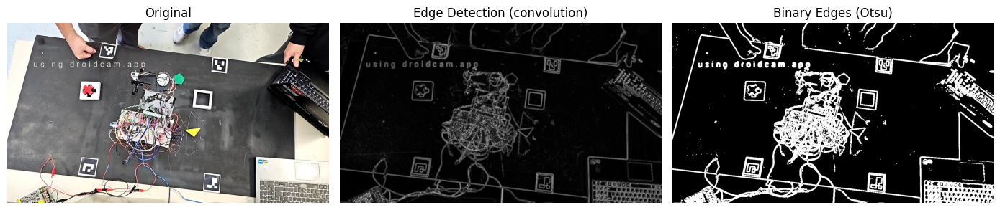


  STEP 3: Harris Corner Detection


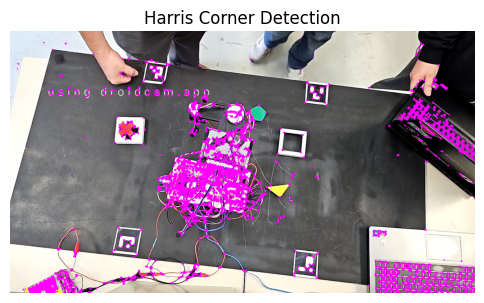


  STEP 4: HSV color masks


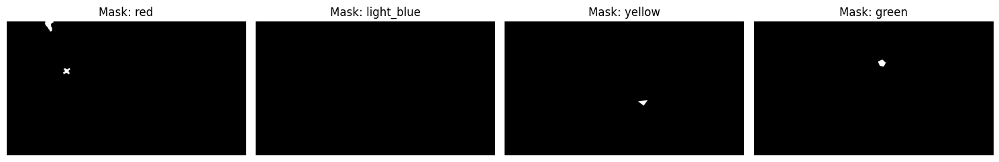


  PASO 5: Detección y clasificación de shapes


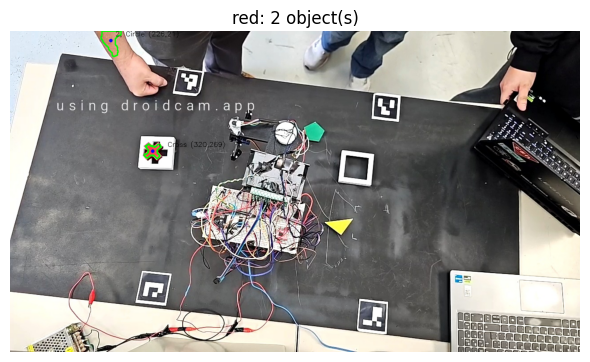

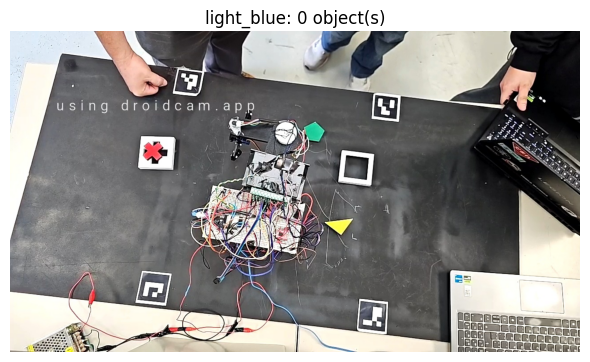

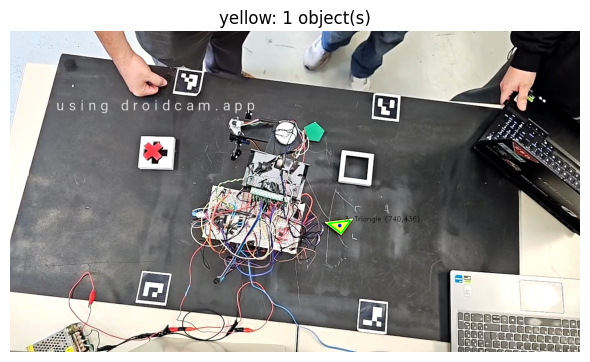

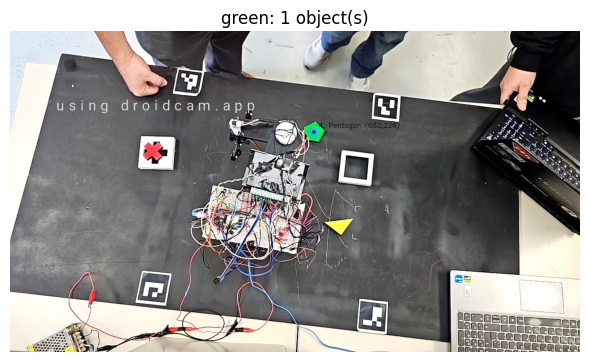

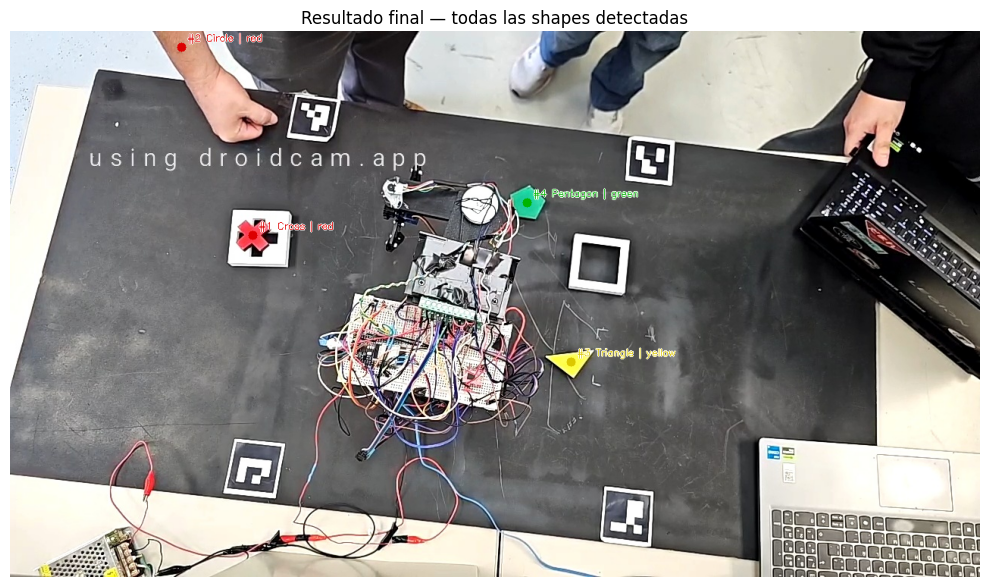


  STEP 6: Grip angle calculation
  Encoder unavailable — using minimum absolute value

  ID        Color        Shape     Raw°    Grip°  Método
──────────────────────────────────────────────────────────────────────
   1          red        Cross     47.5    -42.5  cross_+45_sym90
   2          red       Circle      0.0      0.0  circle_symmetric
   3       yellow     Triangle     83.2     83.2  triangle_hypotenuse_perp
   4        green     Pentagon    -11.9    -11.9  pentagon_top_vertex


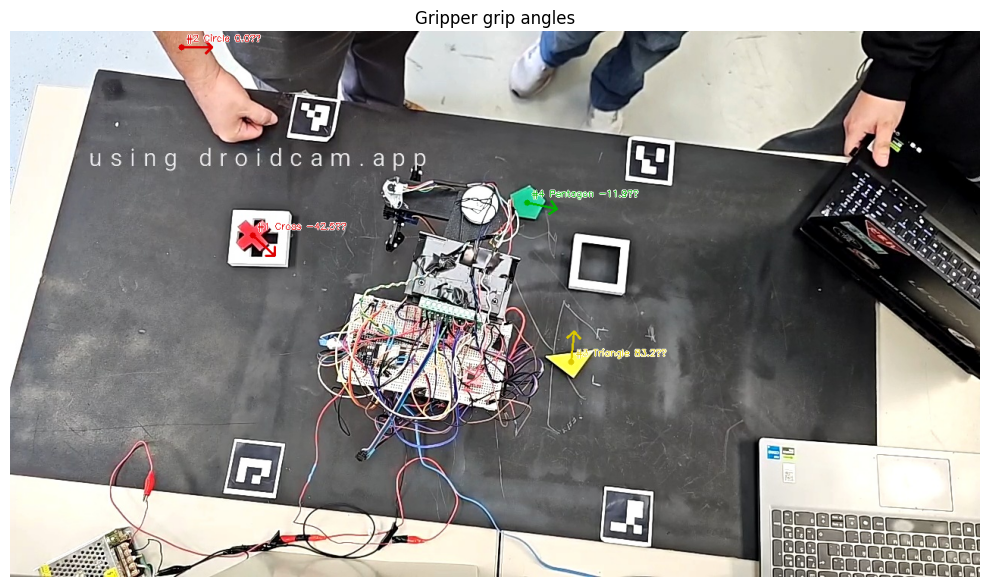


  STEP 7: ArUco Homography (workspace 562×562 mm)


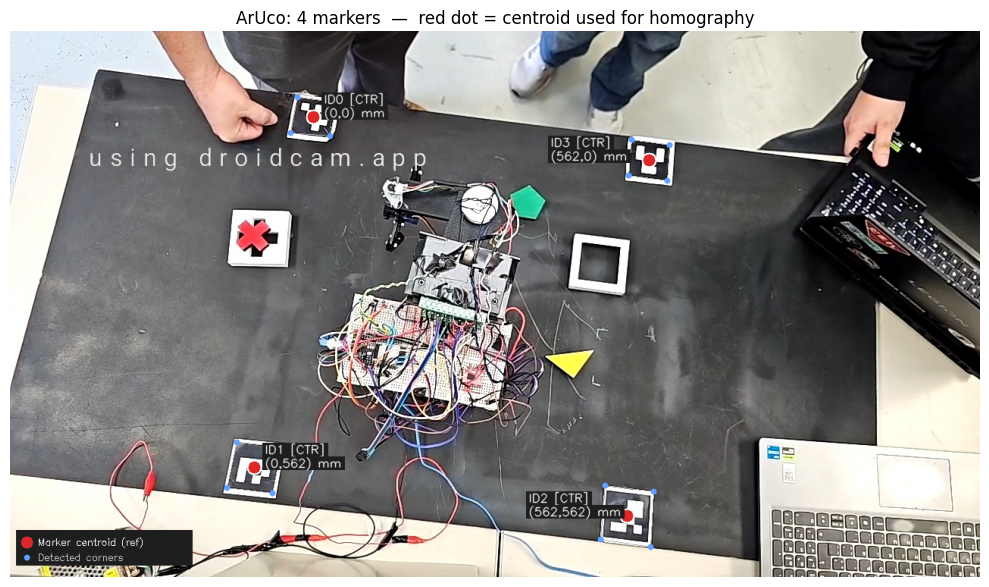

  [ArUco] Homography computed successfully
  Verification (computed vs expected):
    ID1: calc (-0.0,562.0) | esperado (0.0,562.0) | err 0.00 mm
    ID2: calc (562.0,562.0) | esperado (562.0,562.0) | err 0.00 mm
    ID0: calc (-0.0,0.0) | esperado (0.0,0.0) | err 0.00 mm
    ID3: calc (562.0,0.0) | esperado (562.0,0.0) | err 0.00 mm

Homography Matrix H:
[[     1.2639      0.2141     -530.45]
 [    -0.1724      1.3451     -83.284]
 [         -0      0.0002           1]]


NameError: name 'full_payload_' is not defined

In [ ]:
"""
deteccion_shapes.py
────────────────────
Full computer vision pipeline for VS Code / local Python.
Reads photo.jpg (generated by tomar_foto.py) and runs:

  1. Carga de imagen
  2. Edge detection (Laplacian 3×3)       ← SIN CAMBIOS
  3. Harris Corner Detection                    ← SIN CAMBIOS
  4. Máscaras HSV por color                     ← SIN CAMBIOS
  5. Shape classification (multi-epsilon)     ← SIN CAMBIOS
  6. Gripper orientation angle calculation  ← NUEVO
  7. ArUco homography pixel → mm
  8. MQTT publishing with angle (local broker)
  9. CSV backup saving

ArUco orientation (reference photo):
   ID 0 → (0,  0 )   top-left corner   Y baja ↓
   ID 1 → (60, 0 )   top-right             X va →
   ID 2 → (60, 60)   bottom-right
   ID 3 → (0,  60)   bottom-left

Angle logic per shape:
   Square    → longest side axis → mod 90° → range -45° to 45°
   Rectangle → same as Square
   Triangle  → hypotenuse (longest side) → perpendicular angle
   Pentagon  → topmost vertex (min Y in image) → pointing up
   Cross     → bounding box main axis + 45°
   Circle    → 0° (simétrico)

Color priority for MQTT: red → yellow → light_blue → green

Dependencias:
   pip install opencv-contrib-python numpy matplotlib paho-mqtt
"""

import cv2
import csv
import json
import os
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime

# ── Optional MQTT ─────────────────────────────────────────────────────────
try:
    import paho.mqtt.client as mqtt
    MQTT_AVAILABLE = True
except ImportError:
    MQTT_AVAILABLE = False
    print("[MQTT] paho-mqtt not installed. Install with: pip install paho-mqtt")

# ════════════════════════════════════════════════════════════════════════════
#  CONFIGURATION  ← edit here for your environment
# ════════════════════════════════════════════════════════════════════════════

IMAGE_PATH  = "photo.jpg"
CSV_FOLDER  = "detections"

MQTT_BROKER = "localhost"
MQTT_PORT   = 1883
MQTT_TOPIC  = "robot/shapes"

# Real robot workspace (mm)
WS_X_MM = 562.0    # 56.2 cm measured physically between inner corners
WS_Y_MM = 562.0

# ── Actual board layout (seen from above) ──────────────────────────
#
#   ID0 ──────────────── ID3
#    |                    |
#    |   WORKSPACE        |       X →
#    |   54×54 cm         |       Y ↓
#    |                    |
#   ID1 ──────────────── ID2
#
#  Assigned robot coordinates:
#   ID0 → (  0,   0)  superior-izquierda
#   ID3 → (540,   0)  top-right
#   ID1 → (  0, 540)  bottom-left
#   ID2 → (540, 540)  bottom-right
# ─────────────────────────────────────────────────────────────────────────
ARUCO_ROBOT_COORDS = {
    0: [0.0,     0.0    ],   # sup-izq
    3: [WS_X_MM, 0.0    ],   # sup-der
    1: [0.0,     WS_Y_MM],   # inf-izq
    2: [WS_X_MM, WS_Y_MM],   # inf-der
}

# Inner corners — no longer used (centroid used as reference)

# Wrist encoder limit range (grados)
WRIST_MIN = -135.0
WRIST_MAX =  135.0

# Color priority order for MQTT publishing
COLOR_PRIORITY = ["red", "yellow", "light_blue", "green"]

# ════════════════════════════════════════════════════════════════════════════
#  1. LOAD IMAGE
# ════════════════════════════════════════════════════════════════════════════

def load_image(path=IMAGE_PATH):
    image = cv2.imread(path)
    if image is None:
        raise FileNotFoundError(
            f"Image not found: '{path}'\n"
            "  → Run tomar_foto.py first to generate photo.jpg"
        )
    print(f"Image loaded. Size (height, width, channels): {image.shape}")
    return image

# ════════════════════════════════════════════════════════════════════════════
#  2. EDGE DETECTION — Laplacian 3×3  [UNCHANGED]
# ════════════════════════════════════════════════════════════════════════════

def compute_edges(image):
    gray    = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    edge_kernel = np.array([
        [-1, -1, -1],
        [-1,  8, -1],
        [-1, -1, -1]
    ], dtype=np.float32)

    edges_raw  = cv2.filter2D(blurred, cv2.CV_32F, edge_kernel)
    edges_abs  = np.abs(edges_raw)
    edges_norm = np.clip(edges_abs, 0, 255).astype(np.uint8)

    _, edge_binary = cv2.threshold(
        edges_norm, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU
    )
    edge_binary = cv2.dilate(
        edge_binary,
        cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2)),
        iterations=1
    )

    plt.figure(figsize=(14, 4))
    plt.subplot(1, 3, 1); plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Original"); plt.axis("off")
    plt.subplot(1, 3, 2); plt.imshow(edges_norm, cmap="gray")
    plt.title("Edge Detection (convolution)"); plt.axis("off")
    plt.subplot(1, 3, 3); plt.imshow(edge_binary, cmap="gray")
    plt.title("Binary Edges (Otsu)"); plt.axis("off")
    plt.tight_layout(); plt.show()

    return gray, edge_binary

# ════════════════════════════════════════════════════════════════════════════
#  3. HARRIS CORNERS  [UNCHANGED]
# ════════════════════════════════════════════════════════════════════════════

def harris_corners(image, gray):
    harris_img = image.copy()
    gray_f     = np.float32(gray)
    dst        = cv2.cornerHarris(gray_f, blockSize=3, ksize=3, k=0.04)
    dst        = cv2.dilate(dst, None)
    harris_img[dst > 0.01 * dst.max()] = [255, 0, 255]

    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(harris_img, cv2.COLOR_BGR2RGB))
    plt.title("Harris Corner Detection"); plt.axis("off"); plt.show()

# ════════════════════════════════════════════════════════════════════════════
#  4. HSV MASKS  [UNCHANGED]
# ════════════════════════════════════════════════════════════════════════════

def build_color_masks(image, edge_binary):
    IMG_H, IMG_W       = image.shape[:2]
    MAX_OBJ_W          = int(IMG_W * 0.40)
    MAX_OBJ_H          = int(IMG_H * 0.40)
    MIN_COMPONENT_AREA = 500

    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    color_ranges = {
        'red': [
            (np.array([0,   100, 80]),  np.array([10,  255, 255])),
            (np.array([165, 100, 80]),  np.array([180, 255, 255])),
        ],
        'light_blue': [
            (np.array([85,  40, 80]),   np.array([105, 200, 255])),
        ],
        'yellow': [
            (np.array([18,  80, 80]),   np.array([35,  255, 255])),
        ],
        'green': [
            (np.array([36,  60, 40]),   np.array([84,  255, 255])),
        ],
    }

    kernel_small = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,  5))
    kernel_large = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11, 11))

    def separate_touching_objects(mask):
        n_before, _, stats_before, _ = cv2.connectedComponentsWithStats(mask)
        n_objects_before = n_before - 1
        if n_objects_before <= 1:
            return mask
        areas = sorted(
            [stats_before[i, cv2.CC_STAT_AREA] for i in range(1, n_before)],
            reverse=True
        )
        ratio = areas[0] / (areas[1] + 1e-5) if len(areas) >= 2 else 1.0
        if ratio < 1.6:
            return mask
        dist = cv2.distanceTransform(mask, cv2.DIST_L2, 5)
        if dist.max() == 0:
            return mask
        _, sure_fg = cv2.threshold(dist, 0.5 * dist.max(), 255, 0)
        sure_fg    = sure_fg.astype(np.uint8)
        if cv2.countNonZero(sure_fg) == 0:
            return mask
        sure_bg = cv2.dilate(mask, kernel_small, iterations=3)
        unknown = cv2.subtract(sure_bg, sure_fg)
        _, markers = cv2.connectedComponents(sure_fg)
        markers    = markers + 1
        markers[unknown == 255] = 0
        img_ws_bgr = cv2.bitwise_and(image, image, mask=mask)
        cv2.watershed(img_ws_bgr, markers)
        result = np.zeros_like(mask)
        for label in np.unique(markers):
            if label <= 1:
                continue
            result[markers == label] = 255
        n_after, _, _, _ = cv2.connectedComponentsWithStats(result)
        if (n_after - 1) < n_objects_before:
            return mask
        return result

    clean_masks = {}
    for color, ranges in color_ranges.items():
        mask = np.zeros(hsv.shape[:2], dtype=np.uint8)
        for lower, upper in ranges:
            mask = cv2.bitwise_or(mask, cv2.inRange(hsv, lower, upper))
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN,  kernel_small, iterations=1)
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel_large, iterations=3)
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN,  kernel_small, iterations=1)
        mask = cv2.bitwise_and(mask, cv2.bitwise_not(edge_binary))
        mask = separate_touching_objects(mask)
        num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(mask)
        filtered_mask = np.zeros_like(mask)
        for i in range(1, num_labels):
            area_i = stats[i, cv2.CC_STAT_AREA]
            w_i    = stats[i, cv2.CC_STAT_WIDTH]
            h_i    = stats[i, cv2.CC_STAT_HEIGHT]
            if area_i >= MIN_COMPONENT_AREA and w_i <= MAX_OBJ_W and h_i <= MAX_OBJ_H:
                filtered_mask[labels == i] = 255
        clean_masks[color] = filtered_mask

    plt.figure(figsize=(15, 6))
    for i, (color, mask) in enumerate(clean_masks.items(), start=1):
        plt.subplot(1, len(clean_masks), i)
        plt.imshow(mask, cmap="gray")
        plt.title(f"Mask: {color}"); plt.axis("off")
    plt.tight_layout(); plt.show()

    return clean_masks

# ════════════════════════════════════════════════════════════════════════════
#  5. SHAPE CLASSIFICATION  [UNCHANGED]
# ════════════════════════════════════════════════════════════════════════════

SOLIDITY_RANGES = {
    "Cross":    (0.40, 0.72),
    "Triangle": (0.82, 0.97),
    "Square":   (0.90, 1.00),
    "Pentagon": (0.88, 0.98),
    "Circle":   (0.92, 1.00),
}

def classify_shape(cnt):
    peri = cv2.arcLength(cnt, True)
    if peri == 0:
        return "Unknown", cnt, 0.0
    area           = cv2.contourArea(cnt)
    hull           = cv2.convexHull(cnt)
    hull_area      = cv2.contourArea(hull)
    solidity       = area / hull_area if hull_area > 0 else 0
    convex_deficit = (hull_area - area) / hull_area if hull_area > 0 else 0
    circ           = (4 * np.pi * area / (peri ** 2)) if peri > 0 else 0

    if solidity < 0.72 and convex_deficit > 0.18:
        approx = cv2.approxPolyDP(cnt, 0.01 * peri, True)
        return "Cross", approx, solidity

    votes = {}
    for eps in [0.02, 0.035, 0.05]:
        approx = cv2.approxPolyDP(cnt, eps * peri, True)
        n      = len(approx)
        if circ > 0.82 and solidity > 0.90:
            candidate = "Circle"
        elif n == 3 and solidity >= 0.82:
            candidate = "Triangle"
        elif n == 4 and solidity >= 0.88:
            candidate = "Square"
        elif n == 5 and solidity >= 0.85:
            candidate = "Pentagon"
        elif 6 <= n <= 9 and solidity >= 0.82:
            candidate = "Pentagon"
        elif n == 3 and solidity >= 0.75:
            candidate = "Triangle"
        else:
            candidate = f"Unknown({n}v,sol={solidity:.2f})"
        votes[candidate] = votes.get(candidate, 0) + 1

    winner       = max(votes, key=lambda k: (votes[k], -list(votes).index(k)))
    eps_map      = {"Triangle": 0.04, "Square": 0.03, "Pentagon": 0.03, "Circle": 0.03}
    eps_final    = eps_map.get(winner, 0.03)
    approx_final = cv2.approxPolyDP(cnt, eps_final * peri, True)
    return winner, approx_final, solidity


def detect_objects(image, clean_masks):
    MIN_AREA  = 500
    objects   = []
    COLOR_BGR = {
        'red':        (0,   0,   220),
        'blue':       (200, 60,  0  ),
        'light_blue': (200, 180, 0  ),
        'yellow':     (0,   200, 220),
        'green':      (0,   180, 0  ),
    }

    for color, mask in clean_masks.items():
        img_result = image.copy()
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        count_this_color = 0

        for cnt in contours:
            area = cv2.contourArea(cnt)
            if area < MIN_AREA:
                continue
            M = cv2.moments(cnt)
            if M["m00"] == 0:
                continue
            cx = int(M["m10"] / M["m00"])
            cy = int(M["m01"] / M["m00"])

            perimeter  = cv2.arcLength(cnt, True)
            approx     = cv2.approxPolyDP(cnt, 0.02 * perimeter, True)
            n_vertices = len(approx)
            hull       = cv2.convexHull(cnt)
            hull_area  = cv2.contourArea(hull)
            solidity   = float(area) / hull_area if hull_area > 0 else 0

            if 0.45 < solidity < 0.80 and 6 <= n_vertices <= 16:
                shape = "Cross"
            elif n_vertices == 3:
                shape = "Triangle"
            elif n_vertices == 4:
                shape = "Rectangle"
            elif n_vertices == 5:
                shape = "Pentagon"
            else:
                shape = "Circle"

            count_this_color += 1
            obj_id = len(objects) + 1
            # Store raw contour for angle calculation
            objects.append({
                "id":         obj_id,
                "color":      color,
                "shape":      shape,
                "cx":         cx,
                "cy":         cy,
                "n_vertices": n_vertices,
                "solidity":   solidity,
                "contour":    cnt,          # ← contorno raw para angle
            })

            cv2.drawContours(img_result, [cnt], -1, (0, 255, 0), 2)
            cv2.circle(img_result, (cx, cy), 4, (255, 0, 0), -1)
            cv2.putText(img_result, f"{obj_id}, {shape} ({cx},{cy})",
                        (cx + 10, cy - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 1)

        plt.figure(figsize=(6, 5))
        plt.imshow(cv2.cvtColor(img_result, cv2.COLOR_BGR2RGB))
        plt.title(f"{color}: {count_this_color} object(s)")
        plt.axis("off"); plt.tight_layout(); plt.show()

    # Imagen final
    img_final = image.copy()
    for obj in objects:
        bgr    = COLOR_BGR.get(obj["color"], (0, 255, 0))
        cx, cy = obj["cx"], obj["cy"]
        cv2.circle(img_final, (cx, cy), 6, bgr, -1)
        label = f"#{obj['id']} {obj['shape']} | {obj['color']}"
        cv2.putText(img_final, label, (cx + 8, cy - 8),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.42, (255, 255, 255), 2)
        cv2.putText(img_final, label, (cx + 8, cy - 8),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.42, bgr, 1)

    plt.figure(figsize=(10, 8))
    plt.imshow(cv2.cvtColor(img_final, cv2.COLOR_BGR2RGB))
    plt.title("Resultado final — todas las shapes detectadas")
    plt.axis("off"); plt.tight_layout(); plt.show()

    return objects

# ════════════════════════════════════════════════════════════════════════════
#  6. GRIPPER ORIENTATION ANGLE CALCULATION
#
#  Convención de angle:
#    • Reference axis is the robot X axis (horizontal, →).
#    • Positive angle is counter-clockwise (CCW) when viewed from above.
#    • In image coordinates (Y downward) cv2.minAreaRect returns
#      angles in (-90°, 0°]; we convert to (-90°, 90°] at the end.
#    • Encoder range is [-135°, 135°].
#
#  Per shape:
#    Square / Rectangle
#      minAreaRect gives the longest side axis.
#      Due to 90° symmetry, equivalents are θ, θ+90°, θ-90°, θ+180°.
#      We choose the one minimizing |θ_equiv - current_encoder|.
#
#    Triangle (rectangle)
#      We find the right-angle vertex (el que está más lejos
#      de la hipotenusa). Ideal orientation is for the hypotenuse
#      to be horizontal → angle perpendicular to hypotenuse.
#
#    Pentagon
#      We compute the centroid and find the vertex with minimum Y
#      coordinate (topmost in image). Ideal orientation is for that
#      vertex to point upward (angle 0 in robot system = -90 in
#      image). Due to 72° symmetry, equivalents are θ + k·72°.
#
#    Cross
#      minAreaRect on contour → main axis + 45°
#      (so the gripper grips at the "X").
#
#    Circle
#      0° siempre (simétrico).
# ════════════════════════════════════════════════════════════════════════════

def _normalize_to_range(angle, lo=WRIST_MIN, hi=WRIST_MAX):
    """
    Lleva 'angle' al rango [lo, hi] dando vueltas de 360°.
    If still out of range (range < 360°), returns the nearest limit.
    """
    span = hi - lo
    # Bring to range using modulo
    while angle > hi:
        angle -= 360.0
    while angle < lo:
        angle += 360.0
    # If still out of range (range < 360°), clamp to nearest limit
    if angle > hi:
        angle = hi
    if angle < lo:
        angle = lo
    return angle


def _best_equivalent(base_angle, symmetry_deg, encoder_pos=None,
                      lo=WRIST_MIN, hi=WRIST_MAX):
    """
    Dado un angle base y su simetría (90° para cuadrado, 72° para
    pentágono, 180° para triangle/cruz), genera todos los equivalentes
    within [-360°, 360°] and:
      1. Filters those within [lo, hi].
      2. Si encoder_pos está disponible, elige el más cercano a él.
      3. If no encoder, picks the one with smallest absolute value in range.
    """
    candidates = []
    for k in range(-8, 9):          # wide range to cover all cases
        equiv = base_angle + k * symmetry_deg
        if lo <= equiv <= hi:
            candidates.append(equiv)

    if not candidates:
        # No equivalent fits; normalize directly
        return _normalize_to_range(base_angle, lo, hi)

    if encoder_pos is not None:
        # Minimum distance to current encoder
        return min(candidates, key=lambda a: abs(a - encoder_pos))
    else:
        # Minimum absolute value (least movement from 0)
        return min(candidates, key=abs)


def compute_grip_angle(obj, encoder_pos=None):
    """
    Calculates the grip angle for a detected object.

    Parámetros
    ----------
    obj         : dict con claves 'shape', 'contour', 'cx', 'cy'
    encoder_pos : float | None   current encoder position (degrees)

    Retorna
    -------
    angle_deg : float   final angle in [-135°, 135°]
    raw_angle : float   geometric angle before equivalent selection
    method    : str     description of method used (for debug)
    """
    cnt   = obj["contour"]
    shape = obj["shape"]

    # ── Circle ───────────────────────────────────────────────────────────────
    if shape == "Circle":
        return 0.0, 0.0, "circle_symmetric"

    # ── minAreaRect base (usada por Square, Rectangle, Cross) ────────────────
    rect        = cv2.minAreaRect(cnt)
    rect_angle  = rect[2]           # rango (-90°, 0°] en OpenCV antiguo
                                    # rango (-90°, 90°] en OpenCV ≥ 4.5.1
    rect_w, rect_h = rect[1]

    # Convertir a convención: eje del lado LARGO respecto al eje X
    # cv2.minAreaRect siempre pone el eje del rect en el lado corto si angle<0
    if rect_w < rect_h:
        long_axis_angle = rect_angle + 90.0
    else:
        long_axis_angle = rect_angle

    # Llevar al rango (-90°, 90°]
    while long_axis_angle > 90.0:
        long_axis_angle -= 180.0
    while long_axis_angle <= -90.0:
        long_axis_angle += 180.0

    # ── Square / Rectangle ───────────────────────────────────────────────────
    if shape in ("Square", "Rectangle"):
        # Simetría 90°: los lados son equivalentes cada 90°
        final = _best_equivalent(long_axis_angle, 90.0, encoder_pos)
        return round(final, 1), round(long_axis_angle, 1), "minAreaRect_sym90"

    # ── Cross ─────────────────────────────────────────────────────────────────
    if shape == "Cross":
        # Eje principal + 45° para agarre en "X"
        cross_angle = long_axis_angle + 45.0
        # Simetría 90° (la cruz tiene simetría de 90°)
        final = _best_equivalent(cross_angle, 90.0, encoder_pos)
        return round(final, 1), round(cross_angle, 1), "cross_+45_sym90"

    # ── Triangle ─────────────────────────────────────────────────────────────
    if shape == "Triangle":
        # Aproximar contorno a 3 vértices
        peri   = cv2.arcLength(cnt, True)
        approx = cv2.approxPolyDP(cnt, 0.04 * peri, True)

        # Asegurar exactamente 3 vértices (fallback a minAreaRect si no)
        if len(approx) != 3:
            final = _best_equivalent(long_axis_angle, 180.0, encoder_pos)
            return round(final, 1), round(long_axis_angle, 1), "triangle_fallback_minRect"

        pts = approx.reshape(3, 2).astype(float)
        cx  = float(obj["cx"])
        cy  = float(obj["cy"])

        # Encontrar la hipotenusa: el lado más largo
        sides = []
        for i in range(3):
            p1 = pts[i]
            p2 = pts[(i + 1) % 3]
            length = np.linalg.norm(p2 - p1)
            sides.append((length, i, p1, p2))
        sides.sort(reverse=True)

        # Lado más largo = hipotenusa
        _, hyp_i, hyp_p1, hyp_p2 = sides[0]

        # Ángulo de la hipotenusa respecto al eje X
        dx = hyp_p2[0] - hyp_p1[0]
        dy = hyp_p2[1] - hyp_p1[1]
        hyp_angle = np.degrees(np.arctan2(dy, dx))   # (-180°, 180°]

        # Orientación ideal: hipotenusa horizontal → gripper perpendicular a ella
        # → angle de agarre = hipotenusa + 90°
        grip_raw = hyp_angle + 90.0

        # Normalizar a (-90°, 90°]
        while grip_raw > 90.0:
            grip_raw -= 180.0
        while grip_raw <= -90.0:
            grip_raw += 180.0

        # Simetría 180° (el triangle se puede agarrar por ambos catetos)
        final = _best_equivalent(grip_raw, 180.0, encoder_pos)
        return round(final, 1), round(grip_raw, 1), "triangle_hypotenuse_perp"

    # ── Pentagon ──────────────────────────────────────────────────────────────
    if shape == "Pentagon":
        peri   = cv2.arcLength(cnt, True)
        approx = cv2.approxPolyDP(cnt, 0.03 * peri, True)

        if len(approx) < 3:
            final = _best_equivalent(long_axis_angle, 72.0, encoder_pos)
            return round(final, 1), round(long_axis_angle, 1), "pentagon_fallback"

        pts = approx.reshape(-1, 2).astype(float)
        cx  = float(obj["cx"])
        cy  = float(obj["cy"])

        # Vértice con Y mínima en imagen (el "más alto" visualmente)
        top_idx = int(np.argmin(pts[:, 1]))
        top_pt  = pts[top_idx]

        # Vector centroid → top vertex
        vec_x = top_pt[0] - cx
        vec_y = top_pt[1] - cy    # Y imagen baja hacia abajo

        # Ángulo de ese vector respecto al eje X de imagen
        angle_to_top = np.degrees(np.arctan2(-vec_y, vec_x))  # flip Y para CCW+

        # Ideal orientation is for that vértice apunte "arriba" (90° en robot)
        # → angle de agarre = angle_to_top - 90°
        grip_raw = angle_to_top - 90.0

        # Normalizar a (-90°, 90°]
        while grip_raw > 90.0:
            grip_raw -= 180.0
        while grip_raw <= -90.0:
            grip_raw += 180.0

        # Simetría 72° (pentágono regular)
        final = _best_equivalent(grip_raw, 72.0, encoder_pos)
        return round(final, 1), round(grip_raw, 1), "pentagon_top_vertex"

    # ── Fallback ──────────────────────────────────────────────────────────────
    final = _best_equivalent(long_axis_angle, 180.0, encoder_pos)
    return round(final, 1), round(long_axis_angle, 1), "fallback_minAreaRect"


def add_angles_to_objects(objects, encoder_pos=None):
    """
    Adds 'grip_angle', 'raw_angle' y 'angle_method' to each object.
    encoder_pos: current encoder position in degrees (None if unavailable).
    """
    print(f"\n{'ID':>4} {'Color':>12} {'Shape':>12} "
          f"{'Raw°':>8} {'Grip°':>8}  Método")
    print("─" * 70)

    for obj in objects:
        grip, raw, method = compute_grip_angle(obj, encoder_pos)
        obj["grip_angle"]   = grip
        obj["raw_angle"]    = raw
        obj["angle_method"] = method
        print(f"{obj['id']:>4} {obj['color']:>12} {obj['shape']:>12} "
              f"{raw:>8.1f} {grip:>8.1f}  {method}")

    return objects


def visualize_angles(image, objects):
    """
    Draws an arrow on the image indicating the grip angle
    for each detected object.
    """
    img_out  = image.copy()
    arrow_len = 40   # píxeles

    COLOR_BGR = {
        'red':        (0,   0,   220),
        'light_blue': (200, 180, 0  ),
        'yellow':     (0,   200, 220),
        'green':      (0,   180, 0  ),
    }

    for obj in objects:
        if "grip_angle" not in obj:
            continue

        cx, cy    = obj["cx"], obj["cy"]
        angle_deg = obj["grip_angle"]
        bgr       = COLOR_BGR.get(obj["color"], (0, 255, 0))

        # Ángulo en radianes; Y imagen está invertida → -sin
        rad  = np.radians(angle_deg)
        ex   = int(cx + arrow_len * np.cos(rad))
        ey   = int(cy - arrow_len * np.sin(rad))

        cv2.arrowedLine(img_out, (cx, cy), (ex, ey), bgr, 2, tipLength=0.3)
        cv2.circle(img_out, (cx, cy), 4, bgr, -1)

        label = f"#{obj['id']} {obj['shape']} {angle_deg}°"
        cv2.putText(img_out, label, (cx + 6, cy - 8),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.40, (255, 255, 255), 2)
        cv2.putText(img_out, label, (cx + 6, cy - 8),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.40, bgr, 1)

    plt.figure(figsize=(10, 8))
    plt.imshow(cv2.cvtColor(img_out, cv2.COLOR_BGR2RGB))
    plt.title("Gripper grip angles")
    plt.axis("off"); plt.tight_layout(); plt.show()

# ════════════════════════════════════════════════════════════════════════════
#  7. ArUco HOMOGRAPHY  pixel → mm
# ════════════════════════════════════════════════════════════════════════════

def compute_aruco_homography(img_bgr):
    gray_aruco = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    aruco_dict = cv2.aruco.getPredefinedDictionary(cv2.aruco.DICT_4X4_50)
    parameters = cv2.aruco.DetectorParameters()
    detector   = cv2.aruco.ArucoDetector(aruco_dict, parameters)
    corners, ids, _ = detector.detectMarkers(gray_aruco)

    if ids is None or len(ids) < 4:
        found = 0 if ids is None else len(ids)
        print(f"  [ArUco] Only {found}/4 markers — using fallback H")
        return None, None, None

    pix_pts, rob_pts = [], []
    img_vis = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB).copy()

    CORNER_NAMES = {0: "TL", 1: "TR", 2: "BR", 3: "BL"}

    for i in range(len(ids)):
        mid = int(ids[i][0])
        if mid not in ARUCO_ROBOT_COORDS:
            continue

        c = corners[i][0]   # shape (4,2): TL, TR, BR, BL

        # ── Use CENTROID (average of 4 corners) ──────────────────────────
        ref_pt = c.mean(axis=0)
        pix_pts.append(ref_pt)
        rob_pts.append(ARUCO_ROBOT_COORDS[mid])

        rx_mm, ry_mm = ARUCO_ROBOT_COORDS[mid]
        rx_px, ry_px = int(ref_pt[0]), int(ref_pt[1])

        # ── Draw marker outline ──────────────────────────────────────────
        pts = c.astype(int)
        cv2.polylines(img_vis, [pts], isClosed=True,
                      color=(180, 180, 180), thickness=1)

        # ── Draw 4 corners in blue ───────────────────────────────────────
        for pt in pts:
            cv2.circle(img_vis, tuple(pt), 4, (100, 160, 255), -1)

        # ── Centroide en ROJO ─────────────────────────────────────────────
        cv2.circle(img_vis, (rx_px, ry_px), 10, (255, 255, 255), -1)
        cv2.circle(img_vis, (rx_px, ry_px), 8,  (220,  40,  40), -1)

        # ── Etiqueta con fondo negro ──────────────────────────────────────
        label1 = f"ID{mid} [CTR]"
        label2 = f"({int(rx_mm)},{int(ry_mm)}) mm"

        h_img, w_img = img_vis.shape[:2]
        txt_x = rx_px + 14 if rx_px < w_img // 2 else rx_px - 130
        txt_y = ry_px - 18  if ry_px > 40         else ry_px + 30

        for dy, txt in enumerate([label1, label2]):
            ty = txt_y + dy * 18
            (tw, th), _ = cv2.getTextSize(txt, cv2.FONT_HERSHEY_SIMPLEX, 0.52, 1)
            cv2.rectangle(img_vis, (txt_x - 3, ty - th - 2),
                          (txt_x + tw + 3, ty + 3), (30, 30, 30), -1)
            cv2.putText(img_vis, txt, (txt_x, ty),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.52, (255, 255, 255), 1,
                        cv2.LINE_AA)

    # ── Leyenda ───────────────────────────────────────────────────────────
    leg_y = img_vis.shape[0] - 50
    cv2.rectangle(img_vis, (8, leg_y - 12), (240, leg_y + 34), (30, 30, 30), -1)
    cv2.circle(img_vis,  (22, leg_y + 4),  8,  (220, 40, 40), -1)
    cv2.putText(img_vis, "Marker centroid (ref)",
                (36, leg_y + 8), cv2.FONT_HERSHEY_SIMPLEX, 0.42, (255, 255, 255), 1)
    cv2.circle(img_vis,  (22, leg_y + 24), 4,  (100, 160, 255), -1)
    cv2.putText(img_vis, "Detected corners",
                (36, leg_y + 28), cv2.FONT_HERSHEY_SIMPLEX, 0.42, (200, 200, 200), 1)

    plt.figure(figsize=(10, 7))
    plt.imshow(img_vis)
    plt.title(f"ArUco: {len(pix_pts)} markers  —  "
              f"red dot = centroid used for homography")
    plt.axis("off"); plt.tight_layout(); plt.show()

    if len(pix_pts) < 4:
        print(f"  [ArUco] Only {len(pix_pts)} valid — fallback H")
        return None, None, None

    pix_arr    = np.array(pix_pts, dtype=np.float32)
    rob_arr    = np.array(rob_pts, dtype=np.float32)
    H_aruco, _ = cv2.findHomography(pix_arr, rob_arr)

    print("  [ArUco] Homography computed successfully")
    print("  Verification (computed vs expected):")
    check = cv2.perspectiveTransform(pix_arr.reshape(-1, 1, 2), H_aruco)
    for j in range(len(rob_pts)):
        calc_x, calc_y = check[j][0]
        exp_x,  exp_y  = rob_pts[j]
        err = np.sqrt((calc_x - exp_x)**2 + (calc_y - exp_y)**2)
        print(f"    ID{int(ids[j][0])}: calc ({calc_x:.1f},{calc_y:.1f}) "
              f"| esperado ({exp_x:.1f},{exp_y:.1f}) | err {err:.2f} mm")

    return H_aruco, pix_arr, rob_arr


def apply_homography(objects, H):
    TARGET_COLORS = {"red", "blue", "light_blue", "yellow", "green"}
    robot_objects = []
    skipped       = []

    # Tolerance margin: allows objects slightly outside the border (mm)
    MARGIN = 40.0

    print(f"\n{'ID':<5} {'Color':<12} {'Shape':<12} {'Pixel (x,y)':<18} {'Robot (mm)':<20} {'Dentro?'}")
    print("─" * 78)

    for obj in objects:
        if obj["color"] not in TARGET_COLORS:
            continue
        p     = np.array([[[obj["cx"], obj["cy"]]]], dtype=np.float32)
        world = cv2.perspectiveTransform(p, H)[0][0]
        rx    = round(float(world[0]), 1)
        ry    = round(float(world[1]), 1)

        inside = (-MARGIN <= rx <= WS_X_MM + MARGIN and
                  -MARGIN <= ry <= WS_Y_MM + MARGIN)

        status = "✓" if inside else "✗ OUT"
        print(f"{obj['id']:<5} {obj['color']:<12} {obj['shape']:<12} "
              f"({obj['cx']},{obj['cy']}){'':<8} ({rx},{ry}) mm{'':<6} {status}")

        if inside:
            # Soft clamp to workspace border
            rx = max(0.0, min(rx, WS_X_MM))
            ry = max(0.0, min(ry, WS_Y_MM))
            robot_objects.append({**obj, "robot_x_mm": rx, "robot_y_mm": ry})
        else:
            skipped.append(obj["id"])

    print(f"\nInside workspace: {len(robot_objects)}  |  Outside (ignored): {skipped}")
    return robot_objects

# ════════════════════════════════════════════════════════════════════════════
#  8. MQTT PUBLISHING  — numeric encoding
#
#  Forma:  1=Square/Rectangle  2=Triangle  3=Pentagon  4=Cross  0=Circle
#  Color:  1=red  2=yellow  3=light_blue  4=green
#
#  Format per shape:  shape,color,x,y,angle
#    x, y  → enteros en mm
#    angulo → entero en grados (redondeado)
#
#  Mensaje completo en esp32/CV  (shapes separadas por |):
#    2,1,120,88,-12|3,2,300,210,0|1,4,400,150,29
#
#  Also publishes each shape to its own priority sub-topic:
#    esp32/CV/1  →  2,1,120,88,-12
#    esp32/CV/2  →  3,2,300,210,0
# ════════════════════════════════════════════════════════════════════════════

# Numeric encoding tables
SHAPE_CODE = {
    "Square":    1,
    "Rectangle": 1,   # same as Square
    "Triangle":  2,
    "Pentagon":  3,
    "Cross":     4,
    "Circle":    0,
}

COLOR_CODE = {
    "red":        1,
    "yellow":     2,
    "light_blue": 3,
    "green":      4,
}


def sort_by_priority(robot_objects):
    """Sorts: red(1) → yellow(2) → light_blue(3) → green(4) → rest."""
    def priority_key(obj):
        try:
            cp = COLOR_PRIORITY.index(obj["color"])
        except ValueError:
            cp = len(COLOR_PRIORITY)
        return (cp, obj["id"])
    return sorted(robot_objects, key=priority_key)


def encode_object(obj):
    """
    Converts a detected object to its numeric representation.
    Returns the tuple (shape, color, x, y, angle) and string 'f,c,x,y,a'.
    """
    shape  = SHAPE_CODE.get(obj["shape"],  0)
    color  = COLOR_CODE.get(obj["color"],  0)
    x      = int(round(obj["robot_x_mm"]))
    y      = int(round(obj["robot_y_mm"]))
    angulo = int(round(obj.get("grip_angle", 0.0)))
    return shape, color, x, y, angulo, f"{shape},{color},{x},{y},{angulo}"


def build_full_payload(ordered):
    """
    Builds the full message with all shapes separated by |.
    Ejemplo: '2,1,120,88,-12|3,2,300,210,0|1,4,400,150,29'
    """
    parts = []
    for o in ordered:
        *_, encoded_str = encode_object(o)
        parts.append(encoded_str)
    return ",".join(parts)


def publish_mqtt(robot_objects):
    if not MQTT_AVAILABLE:
        print("[MQTT] paho-mqtt not available. Skipping publish.")
        return

    ordered = sort_by_priority(robot_objects)

    full_payload = build_full_payload(ordered)

    try:
        try:
            client = mqtt.Client(mqtt.CallbackAPIVersion.VERSION2,
                                 client_id="deteccion_shapes")
        except AttributeError:
            client = mqtt.Client(client_id="deteccion_shapes")

        client.connect(MQTT_BROKER, MQTT_PORT, keepalive=10)
        client.loop_start()

        res = client.publish(MQTT_TOPIC, full_payload, qos=1)
        res.wait_for_publish()
        print(f"[MQTT] {MQTT_TOPIC} → {full_payload}")

        client.loop_stop()
        client.disconnect()
        print(f"\n  Total published: {len(ordered)} shapes")

    except Exception as e:
        print(f"  [MQTT] Error con {MQTT_BROKER}:{MQTT_PORT} → {e}")
        print("  Make sure the broker is running.")

# ════════════════════════════════════════════════════════════════════════════
#  9. CSV SAVING
# ════════════════════════════════════════════════════════════════════════════

def save_csv(objects, robot_objects):
    os.makedirs(CSV_FOLDER, exist_ok=True)
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    csv_path  = os.path.join(CSV_FOLDER, f"detections_{timestamp}.csv")

    ordered    = sort_by_priority(robot_objects)
    fieldnames = [
        "priority", "id",
        "shape_name", "shape_code",
        "color_name", "color_code",
        "pixel_x", "pixel_y",
        "robot_x_mm", "robot_y_mm",
        "grip_angle", "raw_angle", "angle_method",
        "mqtt_payload",
        "vertices", "solidity", "solidity_ok",
    ]

    with open(csv_path, "w", newline="") as f:
        writer = csv.DictWriter(f, fieldnames=fieldnames)
        writer.writeheader()
        for rank, obj in enumerate(ordered, start=1):
            sol    = obj["solidity"]
            shape  = obj["shape"]
            lo, hi = SOLIDITY_RANGES.get(shape, (0.0, 1.0))
            fc, cc, x, y, a, enc = encode_object(obj)
            writer.writerow({
                "priority":     rank,
                "id":           obj["id"],
                "shape_name":   shape,
                "shape_code":   fc,
                "color_name":   obj["color"],
                "color_code":   cc,
                "pixel_x":      obj["cx"],
                "pixel_y":      obj["cy"],
                "robot_x_mm":   obj.get("robot_x_mm", "N/A"),
                "robot_y_mm":   obj.get("robot_y_mm", "N/A"),
                "grip_angle":   obj.get("grip_angle", "N/A"),
                "raw_angle":    obj.get("raw_angle",  "N/A"),
                "angle_method": obj.get("angle_method", ""),
                "mqtt_payload": enc,
                "vertices":     obj["n_vertices"],
                "solidity":     f"{sol:.3f}",
                "solidity_ok":  lo <= sol <= hi,
            })

    print(f"\n[CSV] Saved: {csv_path}  ({len(ordered)} rows)")
    return csv_path


def print_summary(objects):
    print(f"\n{'ID':>4} {'Color':>12} {'Shape':>12} {'X':>6} {'Y':>6} "
          f"{'Verts':>6} {'Solidity':>9}  {'Expected range':<18} {'OK?':>4}")
    print("─" * 80)
    for obj in objects:
        sol    = obj["solidity"]
        shape  = obj["shape"]
        lo, hi = SOLIDITY_RANGES.get(shape, (0.0, 1.0))
        flag   = "  OK" if lo <= sol <= hi else "  !"
        print(f"{obj['id']:>4} {obj['color']:>12} {shape:>12} "
              f"{obj['cx']:>6} {obj['cy']:>6} "
              f"{obj['n_vertices']:>6} {sol:>9.3f}  [{lo:.2f} – {hi:.2f}]{flag}")

# ════════════════════════════════════════════════════════════════════════════
#  MAIN
# ════════════════════════════════════════════════════════════════════════════

if __name__ == "__main__":

    # ── Posición actual del encoder (None si no está disponible) ─────────────
    # Cambia este valor por la lectura real de tu encoder antes de correr.
    ENCODER_CURRENT_POS = None    # ejemplo: 30.0

    print("=" * 60)
    print("  STEP 1: Load image")
    print("=" * 60)
    image = load_image(IMAGE_PATH)

    print("\n" + "=" * 60)
    print("  STEP 2: Edge detection (Laplacian)")
    print("=" * 60)
    gray, edge_binary = compute_edges(image)

    print("\n" + "=" * 60)
    print("  STEP 3: Harris Corner Detection")
    print("=" * 60)
    harris_corners(image, gray)

    print("\n" + "=" * 60)
    print("  STEP 4: HSV color masks")
    print("=" * 60)
    clean_masks = build_color_masks(image, edge_binary)

    print("\n" + "=" * 60)
    print("  PASO 5: Detección y clasificación de shapes")
    print("=" * 60)
    objects = detect_objects(image, clean_masks)

    print("\n" + "=" * 60)
    print("  STEP 6: Grip angle calculation")
    print("=" * 60)
    if ENCODER_CURRENT_POS is not None:
        print(f"  Current encoder: {ENCODER_CURRENT_POS}°")
    else:
        print("  Encoder unavailable — using minimum absolute value")
    objects = add_angles_to_objects(objects, encoder_pos=ENCODER_CURRENT_POS)
    visualize_angles(image, objects)

    print("\n" + "=" * 60)
    print(f"  STEP 7: ArUco Homography (workspace {int(WS_X_MM)}×{int(WS_Y_MM)} mm)")
    print("=" * 60)
    H, _, _ = compute_aruco_homography(image)

    if H is None:
        print("  [Fallback] Using hardcoded pixel→mm mapping")
        _pix = np.array([(50, 50), (200, 50), (200, 180), (50, 180)], dtype=np.float32)
        _rob = np.array([(0, 0), (WS_X_MM, 0), (WS_X_MM, WS_Y_MM), (0, WS_Y_MM)],
                        dtype=np.float32)
        H, _ = cv2.findHomography(_pix, _rob)

    print("\nHomography Matrix H:")
    print(np.round(H, 4))

    robot_objects = apply_homography(objects, H)
    print_summary(objects)
   

    print("\n" + "=" * 60)
    print(f"  STEP 8: MQTT Publishing → {MQTT_BROKER}:{MQTT_PORT}")
    print("  Orden: red → yellow → light_blue → green")
    print("=" * 60)
    publish_mqtt(robot_objects)
    
   

    print("\n" + "=" * 60)
    print("  PASO 9: CSV backup saving")
    print("=" * 60)
    save_csv(objects, robot_objects)

    print("\n✓  Pipeline complete.")

In [18]:
# Verificación rápida de escala H
test_points = {
    "centro_imagen": (image.shape[1]//2, image.shape[0]//2),
}

for nombre, (px, py) in test_points.items():
    p = np.array([[[px, py]]], dtype=np.float32)
    world = cv2.perspectiveTransform(p, H)[0][0]
    print(f"{nombre}: pixel ({px},{py}) → robot ({world[0]:.1f}, {world[1]:.1f}) mm")

centro_imagen: pixel (640,360) → robot (301.2, 190.1) mm


In [20]:
# Diagnóstico: ver coordenadas pixel de cada marcador detectado
gray_aruco = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
aruco_dict = cv2.aruco.getPredefinedDictionary(cv2.aruco.DICT_4X4_50)
parameters = cv2.aruco.DetectorParameters()
detector   = cv2.aruco.ArucoDetector(aruco_dict, parameters)
corners, ids, _ = detector.detectMarkers(gray_aruco)

print(f"Imagen tamaño: {image.shape[1]}×{image.shape[0]} px")
print()
if ids is not None:
    for i in range(len(ids)):
        mid    = int(ids[i][0])
        center = corners[i][0].mean(axis=0)
        print(f"  ArUco ID{mid}: pixel ({center[0]:.1f}, {center[1]:.1f})")

Imagen tamaño: 1280×720 px

  ArUco ID2: pixel (988.8, 582.0)
  ArUco ID1: pixel (450.2, 593.5)
  ArUco ID0: pixel (467.8, 81.8)
  ArUco ID3: pixel (946.0, 93.0)


DICT_4X4_50: 4 detectados  IDs=[2, 1, 0, 3]  rechazados=23
DICT_4X4_100: 4 detectados  IDs=[2, 1, 0, 3]  rechazados=23
DICT_4X4_250: 4 detectados  IDs=[2, 1, 0, 3]  rechazados=23

--- Con parámetros permisivos ---
Resultado: 4 detectados  IDs=[2, 1, 0, 3]


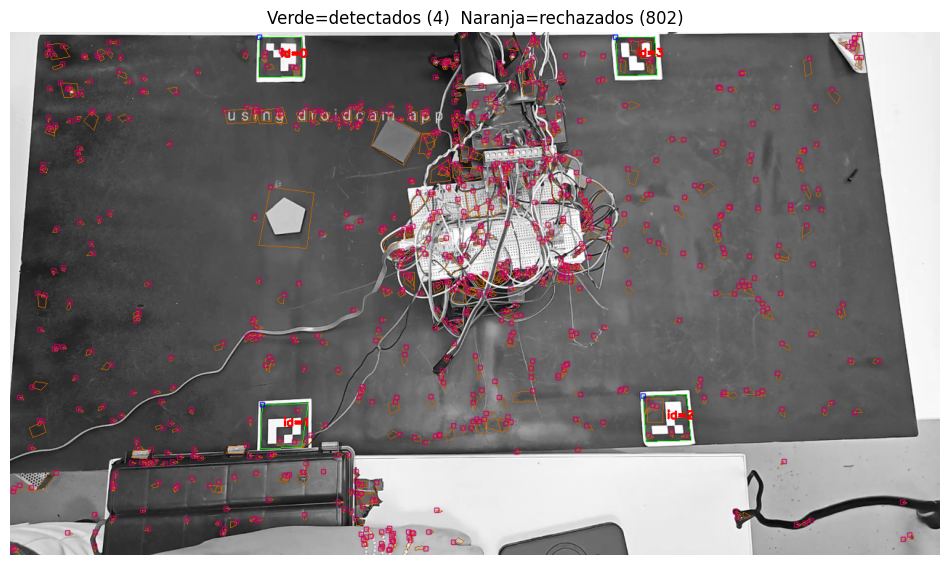

In [43]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# ── Prueba con 3 diccionarios distintos ──────────────────────────────────
dicts_to_try = [
    ("DICT_4X4_50",  cv2.aruco.DICT_4X4_50),
    ("DICT_4X4_100", cv2.aruco.DICT_4X4_100),
    ("DICT_4X4_250", cv2.aruco.DICT_4X4_250),
]

for name, dict_id in dicts_to_try:
    aruco_dict = cv2.aruco.getPredefinedDictionary(dict_id)
    params     = cv2.aruco.DetectorParameters()
    detector   = cv2.aruco.ArucoDetector(aruco_dict, params)
    corners, ids, rejected = detector.detectMarkers(gray)
    found = 0 if ids is None else len(ids)
    ids_found = [] if ids is None else [int(i[0]) for i in ids]
    print(f"{name}: {found} detectados  IDs={ids_found}  rechazados={len(rejected)}")

# ── Prueba con parámetros más permisivos ─────────────────────────────────
print("\n--- Con parámetros permisivos ---")
params2 = cv2.aruco.DetectorParameters()
params2.adaptiveThreshWinSizeMin  = 3
params2.adaptiveThreshWinSizeMax  = 53
params2.adaptiveThreshWinSizeStep = 4
params2.minMarkerPerimeterRate    = 0.01   # acepta marcadores pequeños
params2.maxMarkerPerimeterRate    = 0.5
params2.polygonalApproxAccuracyRate = 0.08

aruco_dict = cv2.aruco.getPredefinedDictionary(cv2.aruco.DICT_4X4_50)
detector2  = cv2.aruco.ArucoDetector(aruco_dict, params2)
corners2, ids2, rejected2 = detector2.detectMarkers(gray)
found2 = 0 if ids2 is None else len(ids2)
ids2_found = [] if ids2 is None else [int(i[0]) for i in ids2]
print(f"Resultado: {found2} detectados  IDs={ids2_found}")

# ── Visualizar rechazados (candidatos que casi fueron marcadores) ─────────
img_debug = cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB)
if rejected2:
    cv2.aruco.drawDetectedMarkers(img_debug, rejected2, borderColor=(200, 100, 0))
if ids2 is not None:
    cv2.aruco.drawDetectedMarkers(img_debug, corners2, ids2)

plt.figure(figsize=(12, 8))
plt.imshow(img_debug)
plt.title(f"Verde=detectados ({found2})  Naranja=rechazados ({len(rejected2)})")
plt.axis("off"); plt.show()